In [1]:
import math
import numpy as np
import sys
import os
import uproot
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from scipy import stats, optimize
import pylandau
from pathlib import Path



findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


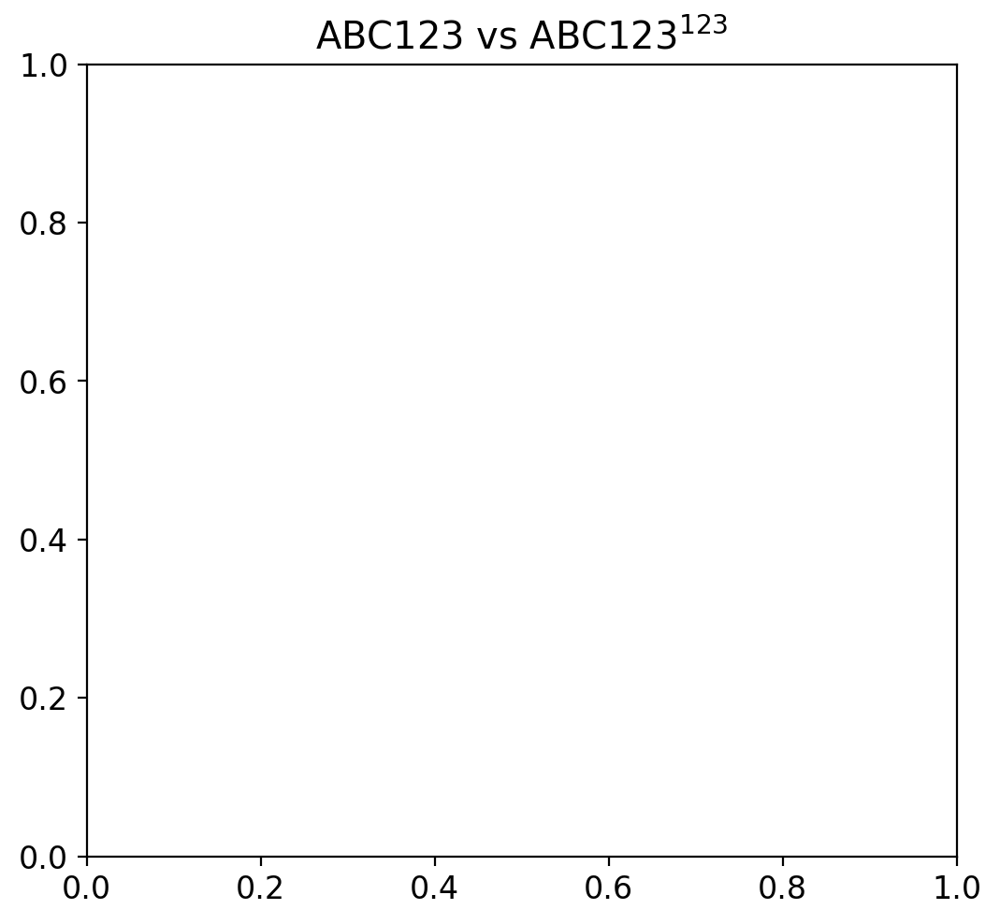

In [2]:
from CRVclasses import *

In [3]:
# from funs import *

plt.rcParams["font.size"]=12
plt.rcParams["axes.labelsize"]=12
plt.rcParams["figure.dpi"]=200
plt.rcParams['figure.figsize'] = [6, 5.5]

In [4]:
%%capture

matplotlib.rcParams['mathtext.fontset'] = 'custom'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
matplotlib.pyplot.title(r'ABC123 vs $\mathrm{ABC123}^{123}$')

matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
matplotlib.pyplot.title(r'ABC123 vs $\mathrm{ABC123}^{123}$')

In [5]:
geo1 = ModuleGeoRect1()

Rectangular module dimensions: L = 3000, l = 1240, D = 4240


(-2200.0, 2200.0)

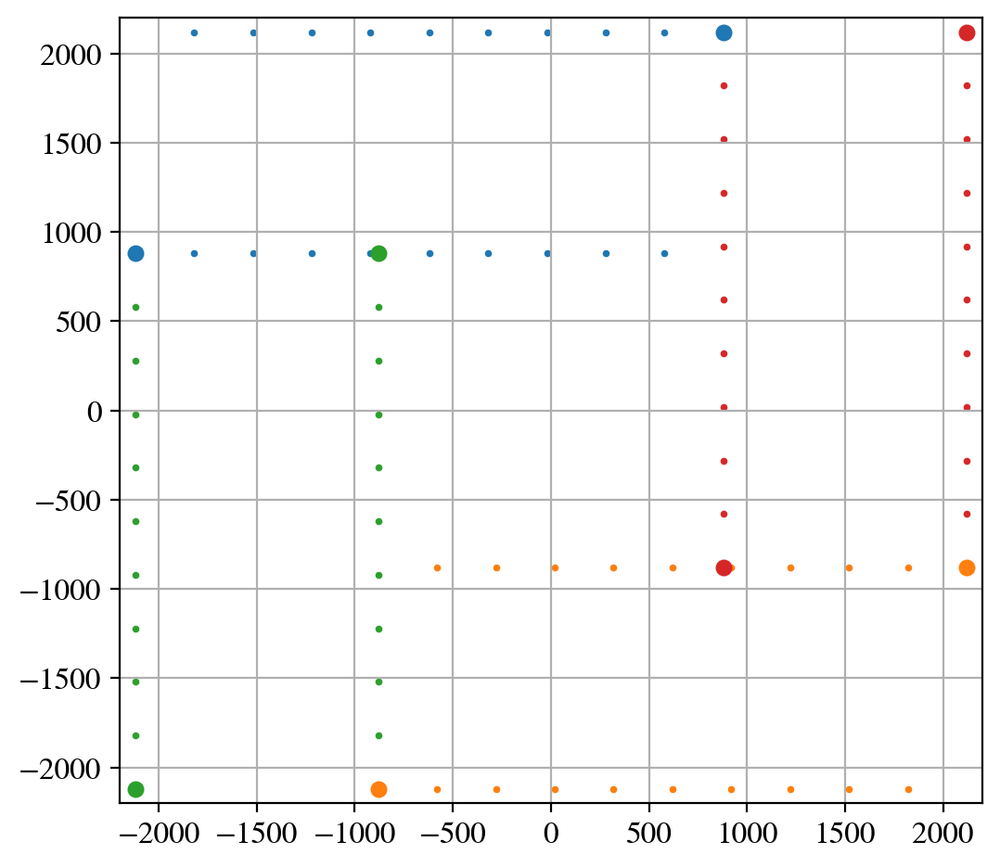

In [6]:
nstrips = 10

for i in range(nstrips):
    plt.scatter(geo1.xStripsBounds1[i], geo1.yStripsBounds1[i], s=3, c='tab:blue')
    plt.scatter(geo1.xStripsBounds2[i], geo1.yStripsBounds2[i], s=3, c='tab:green')
    plt.scatter(geo1.xStripsBounds3[i], geo1.yStripsBounds3[i], s=3, c='tab:orange')
    plt.scatter(geo1.xStripsBounds4[i], geo1.yStripsBounds4[i], s=3, c='tab:red')

plt.scatter(geo1.xBounds1, geo1.yBounds1, s=30, c='tab:blue')
plt.scatter(geo1.xBounds2, geo1.yBounds2, s=30, c='tab:green')
plt.scatter(geo1.xBounds3, geo1.yBounds3, s=30, c='tab:orange')
plt.scatter(geo1.xBounds4, geo1.yBounds4, s=30, c='tab:red')

plt.grid()
plt.xlim(-2200, 2200)
plt.ylim(-2200, 2200)

In [7]:
grid0 = ModuleGeoGrid(ngrid=50)

In [8]:
frontcrv0 = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [9]:
frontcrv0.getGeometry(geo_type='grid', nstrips=43)
frontcrv0.getHitsPerChannel()

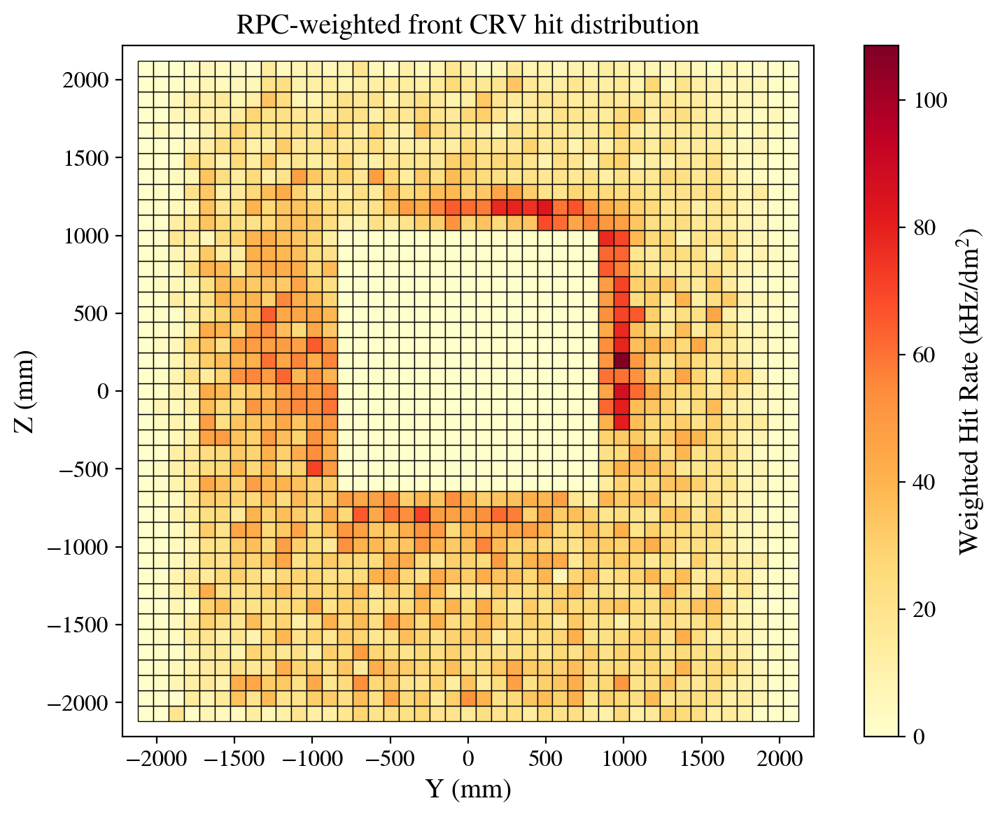

In [10]:
plot_grid_hitmap(frontcrv0, plotHits=False)

In [11]:
## 1 kHz/dm2 = 1000/100 Hz/cm2 = 10 Hz/cm2 

In [12]:
np.corrcoef(frontcrv0.HitT, frontcrv0.HitX), np.corrcoef(frontcrv0.HitT, frontcrv0.HitY), np.corrcoef(frontcrv0.HitT, frontcrv0.HitZ)

(array([[ 1.        , -0.00787421],
        [-0.00787421,  1.        ]]),
 array([[ 1.        , -0.06577853],
        [-0.06577853,  1.        ]]),
 array([[ 1.       , -0.0587527],
        [-0.0587527,  1.       ]]))

In [13]:
def xBins(bins):
    return np.array([ (bins[i]+bins[i+1])/2 for i in range(len(bins)-1) ])

def getPDFfromDist(t_arr, nbins):
    pdf_t, bins_t = np.histogram(t_arr, nbins, density=True)
    xbins_t = xBins(bins_t)
    return pdf_t, xbins_t

def invCDFGen(cdf, xbins, nsamples):
    # draw y-value from uniform distribution
    u_arr = np.random.uniform(0, 1, nsamples)
    # find cdf point index of y-value
    indices = np.searchsorted(cdf, u_arr)
    # get x-value (x_i = F-1(y_i))
    x_dist = xbins[indices]
    return x_dist

def generateFromDist(t_arr, nbins, nsamples):
    pdf_t, xbins_t = getPDFfromDist(t_arr, nbins)
    norm = np.sum(pdf_t)
    print("pdf norm = {:.2e}".format(norm))
    cdf_t = np.cumsum(pdf_t) / norm
    t_dist = invCDFGen(cdf_t, xbins_t, nsamples)
    return t_dist

def getPDFfromDist_2D(x_data, y_data, nbins):
    hist2d, x_edges, y_edges = np.histogram2d(x_data, y_data, bins=nbins, density=True)
    xbins, ybins = xBins(x_edges), xBins(y_edges)
    return hist2d, xbins, ybins

def invCDFGen_2D(cdf, tbins, sbins, nsamples, twoDshape):
    # draw y-value from uniform distribution
    u_arr = np.random.uniform(0, 1, nsamples)
    # find cdf point index of y-value
    indices = np.searchsorted(cdf, u_arr)
    # convert flat indices to 2D bin indices
    t_idx, s_idx = np.unravel_index(indices, twoDshape) 
    # get x-value (x_i = F-1(y_i))
    t_dist = tbins[t_idx]
    s_dist = sbins[s_idx]
    return t_dist, s_dist

def generateFromDist_2D(x_data, y_data, nbins, nsamples):
    hist2d, xbins, ybins = getPDFfromDist_2D(x_data, y_data, nbins)
    pdf = hist2d.flatten()
    norm = np.sum(pdf)
    print("pdf norm = {:.2e}".format(norm))
    cdf = np.cumsum(pdf) / norm
    x_dist, y_dist = invCDFGen_2D(cdf, xbins, ybins, nsamples, hist2d.shape)
    return x_dist, y_dist

def getPDFfromDist_3D(t_data, x_data, y_data, nbinst, nbinsxy):
    hist3d, edges = np.histogramdd([t_data, x_data, y_data], np.array([nbinst, nbinsxy, nbinsxy]), density=True)
    t_edges, x_edges, y_edges = edges
    tbins, xbins, ybins = xBins(t_edges), xBins(x_edges), xBins(y_edges)
    return hist3d, tbins, xbins, ybins

def invCDFGen_3D(cdf, tbins, sbins, rbins, nsamples, twoDshape):
    # draw y-value from uniform distribution
    u_arr = np.random.uniform(0, 1, nsamples)
    # find cdf point index of y-value
    indices = np.searchsorted(cdf, u_arr)
    # convert flat indices to 2D bin indices
    t_idx, s_idx, r_idx = np.unravel_index(indices, twoDshape) 
    # get x-value (x_i = F-1(y_i))
    t_dist = tbins[t_idx]
    s_dist = sbins[s_idx]
    r_dist = rbins[r_idx]
    return t_dist, s_dist, r_dist

def generateFromDist_3D(t_data, x_data, y_data, nbinst, nbinsxy, nsamples):
    hist3d, tbins, xbins, ybins = getPDFfromDist_3D(t_data, x_data, y_data, nbinst, nbinsxy)
    pdf = hist3d.flatten()
    norm = np.sum(pdf)
    print("pdf norm = {:.2e}".format(norm))
    cdf = np.cumsum(pdf) / norm
    t_dist, x_dist, y_dist = invCDFGen_3D(cdf, tbins, xbins, ybins, nsamples, hist3d.shape)
    return t_dist, x_dist, y_dist

In [14]:
### For a 1e6 ns total duration (1e3*1e3 n_bunches * bunch_DT)
### and 1.63e7 POTs / bunch
### nbins = 1e6 (1 bin per ns)
### nsamples = 1.63e10 (1.63e7*1e3 (POTs/bunch)*n_bunches)

nbins = int(1e6) 
# nsamples = int(2*1e7)
nsamples = int(1e6)

tmod = frontcrv0.HitT[frontcrv0.HitT<=1e6]
print(len(tmod/1e3), len(frontcrv0.HitT/1e3))

pdf_t, xbins_t = getPDFfromDist(tmod, nbins)

160965 163669


In [15]:
t_gen = generateFromDist(tmod, nbins, nsamples)

pdf norm = 1.00e+00


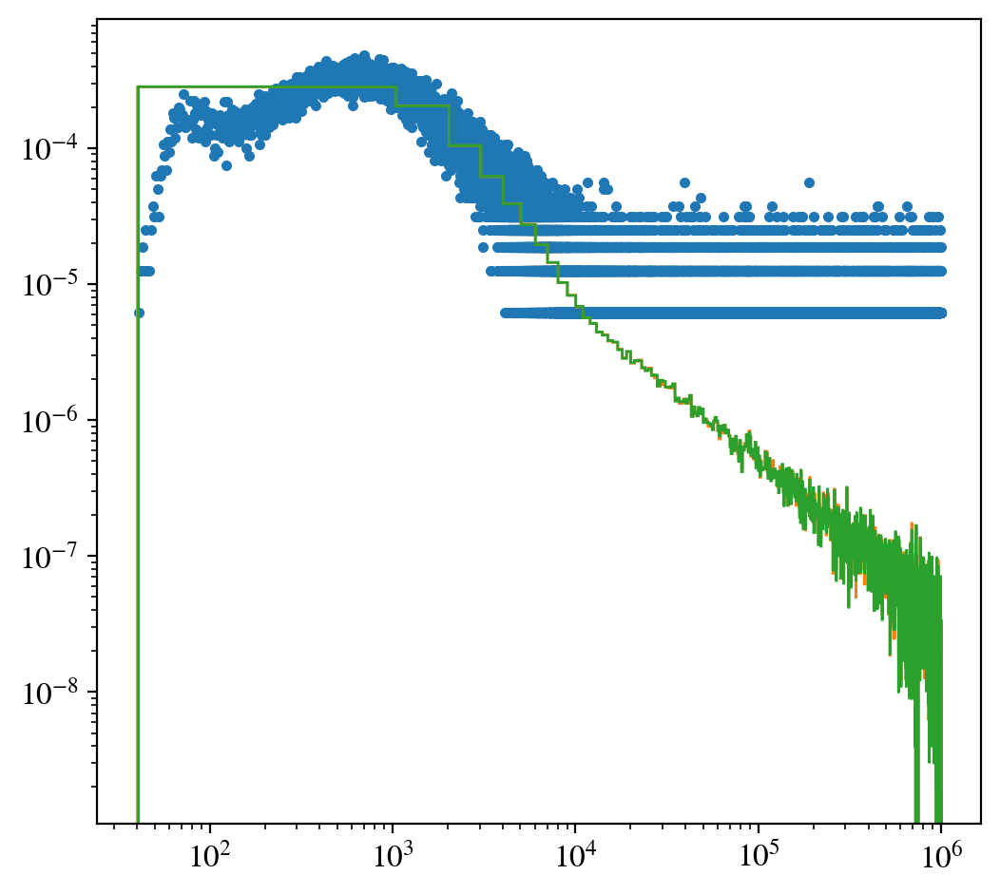

In [16]:

plt.plot(xbins_t, pdf_t, '.')
plt.hist(tmod, 1000, density=True, histtype='step')
plt.hist(t_gen, 1000, density=True, histtype='step')
plt.yscale('log')
# plt.xlim(0, 1e3)
plt.xscale('log')

In [17]:
nPOT = 99995000 
nPOTperBunch = int(1.63e7)
DT = 1316 ## ns, bunch interval
dT = 100 ## ns, pulse duration
nBunches = 1000

# Tmax = int(nBunches*DT)
nHits = len(frontcrv0.HitT)
nHitsPerPOT = nHits/nPOT
nHitsPerBunch = int(nHitsPerPOT*nPOTperBunch)
print(nHits, nHitsPerPOT, nHitsPerBunch)

163669 0.0016367718385919296 26679


In [18]:
### For a 1e6 ns total duration (1e3*1e3 n_bunches * bunch_DT)
### and 1.63e7 POTs / bunch
### nbins = 1e6 (1 bin per ns)
### nsamples = 1.63e10 (1.63e7*1e3 (POTs/bunch)*n_bunches)

nbins = int(1e6) 
nsamples = int(nHitsPerBunch*nBunches)
print(nsamples)

tmod = frontcrv0.HitT[frontcrv0.HitT<=1e6]
print(len(tmod/1e3), len(frontcrv0.HitT/1e3))

pdf_t, xbins_t = getPDFfromDist(tmod, nbins)
t_gen = generateFromDist(tmod, nbins, nsamples)

26679000
160965 163669
pdf norm = 1.00e+00


In [19]:
# bunchT = np.array([np.linspace(ibunch*DT, ibunch*DT + dT, nHitsPerBunch) for ibunch in range(nBunches)])
bunchT = np.array([np.random.uniform(ibunch*DT, ibunch*DT + dT, nHitsPerBunch) for ibunch in range(nBunches)])
bunchT_flat = bunchT.flatten()

len(bunchT_flat), len(t_gen), bunchT_flat[:3]

(26679000, 26679000, array([37.46677215, 98.23607902, 25.74581503]))

In [20]:
### real time distribution (thit) over nBunches bunches
### = uniform distribution of POT t0 + custom distribution of thit-t0 

t_dist_real = bunchT_flat + t_gen

In [21]:
np.max(bunchT_flat)/1e6

1.314783996992693

Text(0.5, 0, 'time (ns)')

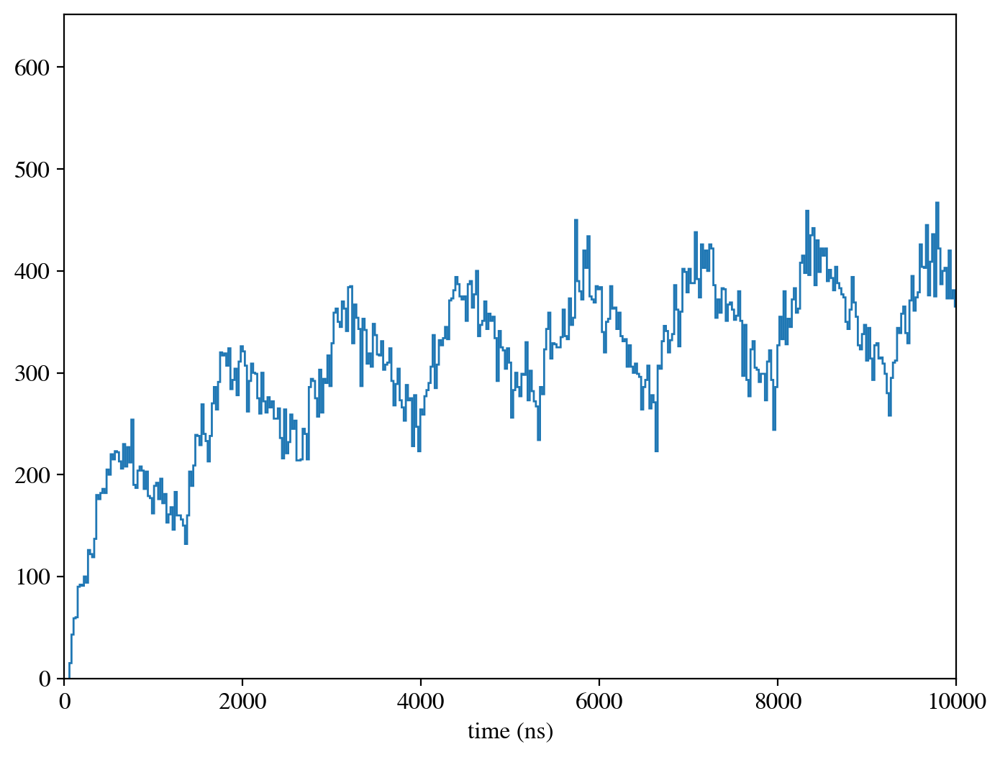

In [22]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.hist(t_dist_real, int(1e5), histtype='step')
## show 3 bunches
# ax.set_xlim(0, int(3*DT))
ax.set_xlim(0, int(1e4))
ax.set_xlabel("time (ns)")

Text(0.5, 0, 'time (ns)')

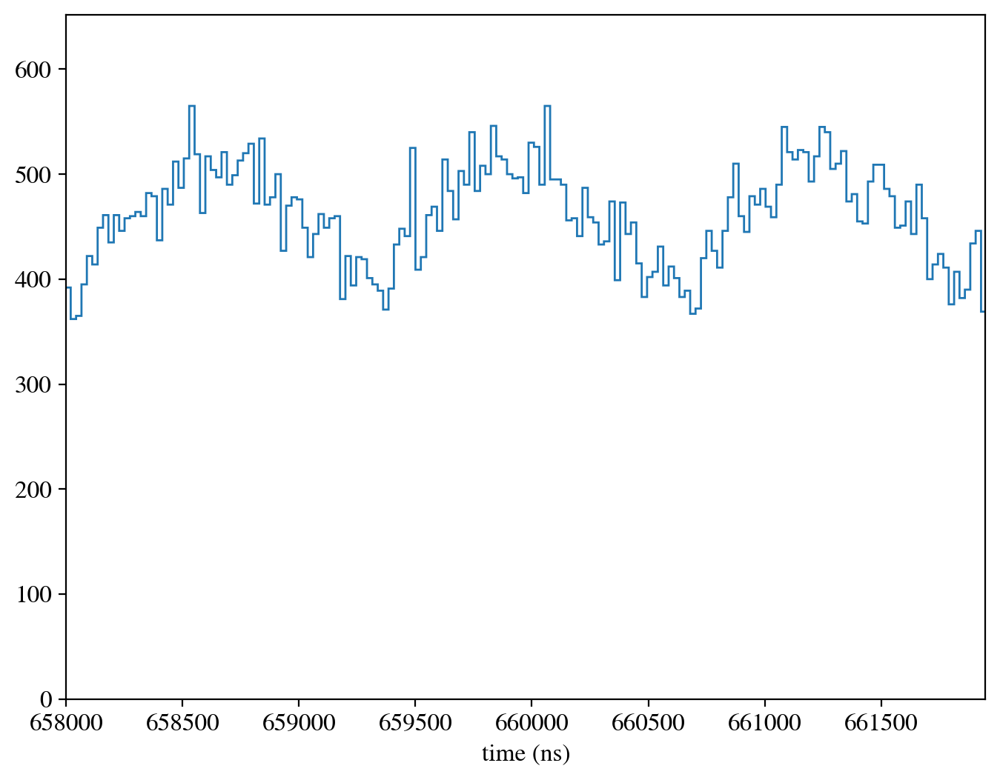

In [23]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.hist(t_dist_real, int(1e5), histtype='step')
## show 3 bunches
# ax.set_xlim(0, int(3*DT))
ax.set_xlim(int(500*DT), int(503*DT))
ax.set_xlabel("time (ns)")

In [24]:
nbins = int(1e4)
nsamples = int(1e6)
# nsamples = int(nHitsPerBunch*nBunches)

xmod = frontcrv0.HitY[frontcrv0.HitT<=2e6]
ymod = frontcrv0.HitZ[frontcrv0.HitT<=2e6]

hist2d, xbins, ybins = getPDFfromDist_2D(xmod, ymod, nbins)
x_dist, y_dist = generateFromDist_2D(xmod, ymod, nbins, nsamples)

pdf norm = 6.18e+00


(array([-923.53976698,  917.40221183]),
 array([-722.75, 1135.75]),
 -3.0687775778600894,
 206.49999999999346,
 1840.9419788122018,
 1858.5)

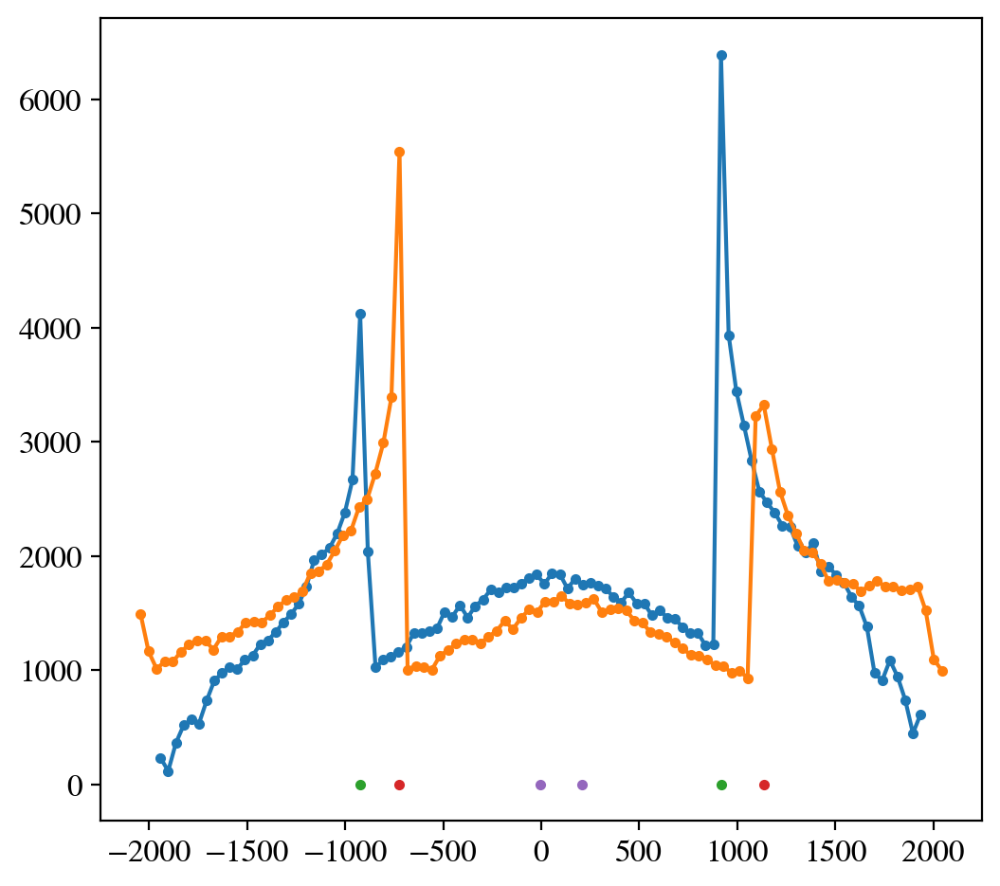

In [25]:
nbins = 100

yhist, ybins = np.histogram(xmod, nbins)
ybins = xBins(ybins)
zhist, zbins = np.histogram(ymod, nbins)
zbins = xBins(zbins)

iywin = [np.argmax(yhist[:nbins//2]), nbins//2 + np.argmax(yhist[nbins//2:])]
izwin = [np.argmax(zhist[:nbins//2]), nbins//2 + np.argmax(zhist[nbins//2:])]

ywin = ybins[iywin]
zwin = zbins[izwin]
ycenter = (ywin[0]+ywin[1])/2
zcenter = (zwin[0]+zwin[1])/2

ywinWidth = ywin[1]-ywin[0]
zwinWidth = zwin[1]-zwin[0]

plt.plot(ybins, yhist, '.-')
plt.plot(zbins, zhist, '.-')
plt.plot(ywin, [0, 0], '.')
plt.plot(zwin, [0, 0], '.')
plt.plot([ycenter, zcenter], [0, 0], '.')

ywin, zwin, ycenter, zcenter, ywinWidth, zwinWidth

In [321]:
med = 11+35+20+30+20+30+12+23+65+13+30+28
medRemb = -19-17-11-29-5
groc = 32
autres = 5+18+8+7+5+4+70+30
clermont = 450
epar = 50
jsps = 96

med, medRemb, groc, autres, clermont, epar, jsps

(317, -81, 32, 147, 450, 50, 96)

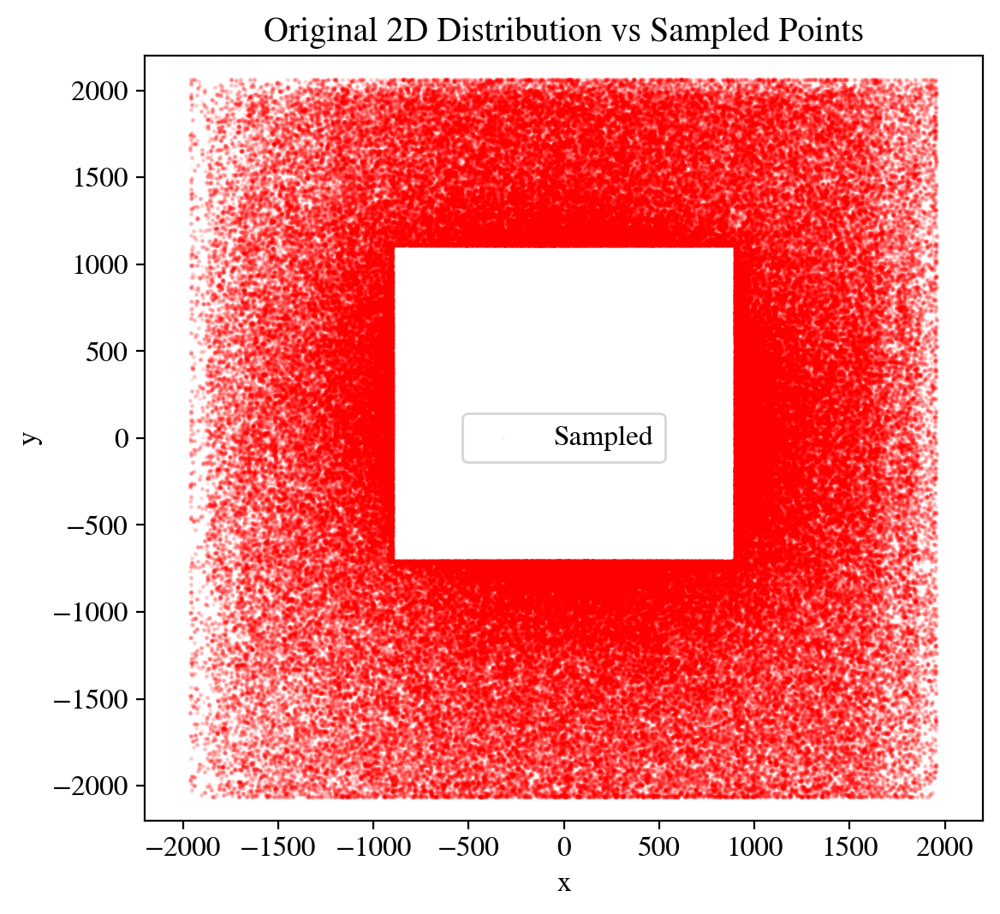

In [26]:
# Plot the results
fig, ax = plt.subplots(figsize=(6, 5.5))
# Plot original histogram as a heatmap
# mesh = ax.hist2d(xmod, ymod, bins=nbins, cmap='Blues', density=True, alpha=1)
# Overlay sampled points
# ax.scatter(xmod, ymod, s=1, color='red', alpha=0.03, label='Sampled')
ax.scatter(x_dist, y_dist, s=1, color='red', alpha=0.03, label='Sampled')

# Customize the plot
ax.set_title('Original 2D Distribution vs Sampled Points')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend()
# plt.colorbar(mesh[3], ax=ax, label='Density')
# plt.grid(True)
plt.xlim(-2200, 2200)
plt.ylim(-2200, 2200)
plt.tight_layout()
plt.show()

In [27]:
# 11: electron
# 13: muon
# 22: photon
# 2112: neutron
# 2212: proton
# 1000010020: deuterium

In [28]:
PID = frontcrv0.treeFront_arr.PID[frontcrv0.IsFirstHit==True]
len(PID)

163669

In [29]:
len(frontcrv0.HitT[PID==22]), len(frontcrv0.HitT[PID==2112])

(44402, 118147)

In [30]:
def getCenterHits(ymin, ymax, zmin, zmax, particle=None):

    HitT = frontcrv0.HitT
    HitX = frontcrv0.HitX
    HitY = frontcrv0.HitY
    HitZ = frontcrv0.HitZ
    IsFirstHit = frontcrv0.IsFirstHit
    PID = frontcrv0.treeFront_arr.PID[IsFirstHit==True]
    # Rho = np.sqrt(HitY**2 + HitZ**2)

    if particle=='neutrons':
        ymod = HitY[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax) & (PID==2112)]
        zmod = HitZ[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax) & (PID==2112)]
    elif particle=='gamma':
        ymod = HitY[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax) & (PID==22)]
        zmod = HitZ[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax) & (PID==22)]
    else:
        ymod = HitY[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax)]
        zmod = HitZ[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax)]

    return ymod, zmod


def getCenterHits_2(rhomax, yoff, zoff, particle=None):

    HitT = frontcrv0.HitT
    HitX = frontcrv0.HitX
    HitY = frontcrv0.HitY - yoff
    HitZ = frontcrv0.HitZ - zoff
    IsFirstHit = frontcrv0.IsFirstHit
    PID = frontcrv0.treeFront_arr.PID[IsFirstHit==True]
    Rho = np.sqrt(HitY**2 + HitZ**2)

    if particle=='neutrons':
        ymod = HitY[(HitT<=2e6) & (Rho<=rhomax) & (PID==2112)]
        zmod = HitZ[(HitT<=2e6) & (Rho<=rhomax) & (PID==2112)]
    elif particle=='gamma':
        ymod = HitY[(HitT<=2e6) & (Rho<=rhomax) & (PID==22)]
        zmod = HitZ[(HitT<=2e6) & (Rho<=rhomax) & (PID==22)]
    else:
        ymod = HitY[(HitT<=2e6) & (Rho<=rhomax)]
        zmod = HitZ[(HitT<=2e6) & (Rho<=rhomax)]

    return ymod, zmod

In [323]:
octoStripWidth = 370
yoff = 0
zoff = 200
# yabs = zwinWidth/2 + octoStripWidth
yabs = 1200
print(yabs)
rhomax = 950

ymin, ymax = -yabs + yoff, yabs + yoff
zmin, zmax = -yabs + zoff, yabs + zoff

y_neu, z_neu = getCenterHits(ymin, ymax, zmin, zmax, 'neutrons')
y_pho, z_pho = getCenterHits(ymin, ymax, zmin, zmax, 'gamma')
y_all, z_all = getCenterHits(ymin, ymax, zmin, zmax)

y_neu, z_neu = y_neu - yoff, z_neu - zoff
y_pho, z_pho = y_pho - yoff, z_pho - zoff
y_all, z_all = y_all - yoff, z_all - zoff

len(y_neu), len(y_pho), len(y_all)

1200


(53677, 12451, 66473)

In [324]:
y_neu_rho, z_neu_rho = getCenterHits_2(rhomax, yoff, zoff, 'neutrons')
y_pho_rho, z_pho_rho = getCenterHits_2(rhomax, yoff, zoff, 'gamma')
y_all_rho, z_all_rho = getCenterHits_2(rhomax, yoff, zoff)

In [325]:
np.mean(frontcrv0.HitY), np.mean(frontcrv0.HitZ)

(154.11259362060545, 41.619986810433275)

96.45036386516294 156.20560238126518


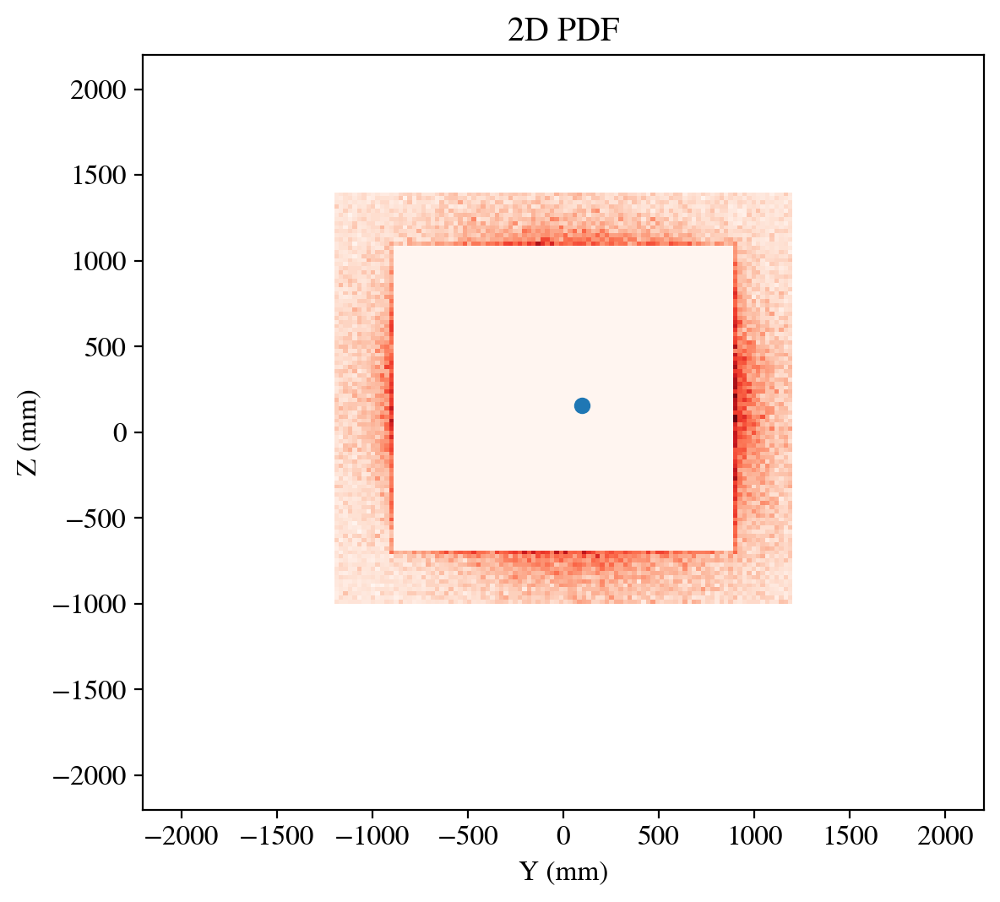

In [387]:
nbins = 100
# norm = mcolors.Normalize(vmin=0, vmax=pdf.max())
# norm = mcolors.LogNorm(vmin=, vmax=pdf.max())
# Call your function
# pdf, xcenters, ycenters = getPDFfromDist_2D(x_data, y_data, nbins=1000)

# pdf, x_edges, y_edges = np.histogram2d(y_pho, z_pho, 100)
# pdf, x_edges, y_edges = np.histogram2d(y_neu, z_neu, 100)
pdf, x_edges, y_edges = np.histogram2d(y_all, z_all, 100)
# pdf, x_edges, y_edges = np.histogram2d(y_all_rho, z_all_rho, 100)

y0_beam, z0_beam = np.mean(y_all), np.mean(z_all)

# Create meshgrid for pcolormesh
X, Y = np.meshgrid(x_edges, y_edges)

# Plot
plt.figure(figsize=(6, 5.5))
# pcm = plt.pcolormesh(X, Y, pdf.T, cmap='Reds', shading='auto')  # note: transpose
# plt.hist2d(y_all_rho, z_all_rho, 100, cmap="Reds")
plt.hist2d(y_all, z_all, nbins, cmap="Reds")
plt.plot(y0_beam, z0_beam, 'o', c='tab:blue')
print(y0_beam, z0_beam)
plt.xlabel("Y (mm)")
plt.ylabel("Z (mm)")
plt.title("2D PDF")
# plt.colorbar(pcm, label='Probability Density')
plt.tight_layout()

plt.xlim(-2200, 2200)
plt.ylim(-2200, 2200)
plt.show()


In [386]:
len(y_all), len(z_all)

(66473, 66473)

In [328]:
# y_all2 = generateFromDist(y_all-yoff, 1000, 100000)
# z_all2 = generateFromDist(z_all-zoff, 1000, 100000)
y_all2 = generateFromDist(y_all, 1000, len(y_all))
z_all2 = generateFromDist(z_all, 1000, len(y_all))

pdf norm = 4.17e-01
pdf norm = 4.17e-01


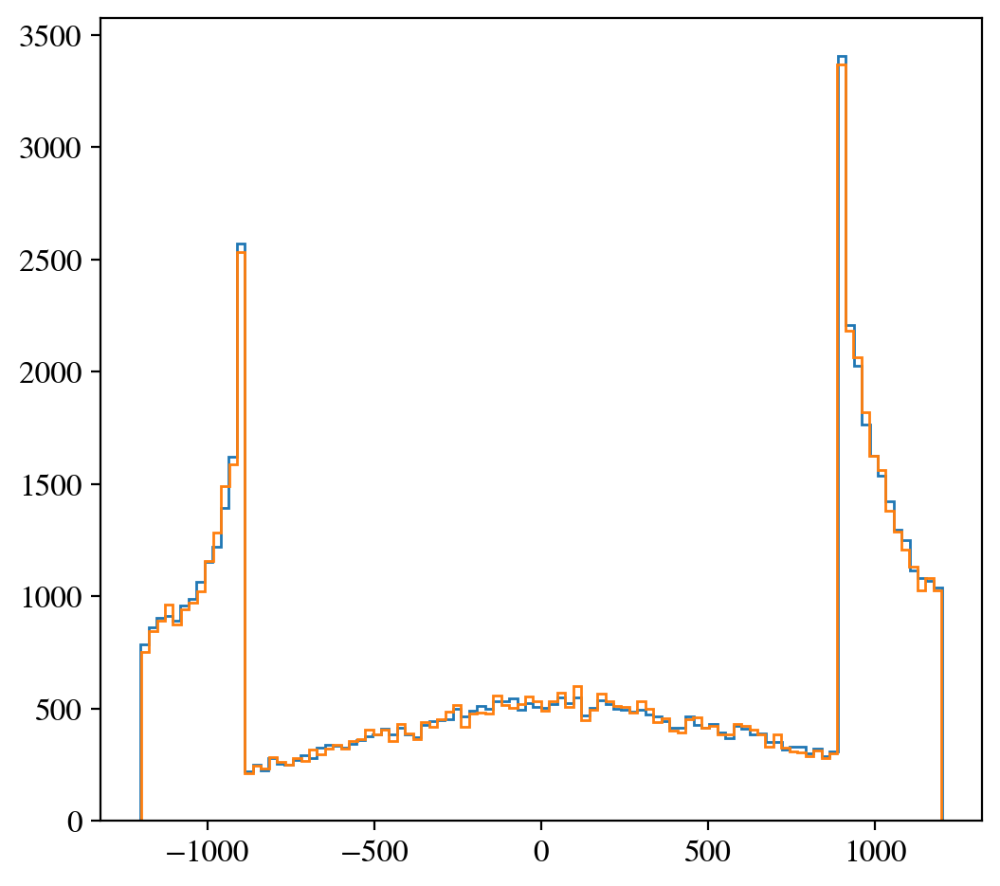

In [329]:
plt.hist(y_all, 100, histtype='step')
plt.hist(y_all2, 100, histtype='step')
# plt.hist(z_all, 100, histtype='step')
# plt.hist(z_all2, 100, histtype='step')
plt.show()

In [330]:
### polar coordonitate in beam frame
# rho = np.sqrt((y_all-y0_beam)**2 + (z_all-z0_beam)**2)
# phi = np.arctan2(z_all-z0_beam, y_all-y0_beam)

rho = np.sqrt(y_all**2 + z_all**2)
phi = np.arctan2(z_all, y_all)
print(len(phi))

rho_neu = np.sqrt(y_neu**2 + z_neu**2)
phi_neu = np.arctan2(z_neu, y_neu)

rho_pho = np.sqrt(y_pho**2 + z_pho**2)
phi_pho = np.arctan2(z_pho, y_pho)

# rho = np.sqrt(y_all_rho**2 + z_all_rho**2)
# phi = np.arctan2(z_all_rho, y_all_rho)

phi_new = generateFromDist(phi, 1000, len(phi))
rho_new = generateFromDist(rho, 1000, len(phi))

print("")

66473
pdf norm = 1.59e+02
pdf norm = 1.26e+00



In [331]:
ll = [2, 3, 4]
ll.extend([6, 7])
ll

[2, 3, 4, 6, 7]

In [497]:
def square_ring_mask(x, y, D):
    R = D / 2
    inside_square = (np.abs(x) <= R) & (np.abs(y) <= R)
    outside_circle = (x**2 + y**2) >= R**2
    return inside_square & outside_circle

def square_frame_mask(x, y, l, L):
    d1 = l/2
    d2 = L/2
    toporbot = (np.abs(x)<d2) & (np.abs(y)<d2) & (np.abs(y)>=d1)
    leftorright = (np.abs(y)<d2) & (np.abs(x)<d2) & (np.abs(x)>=d1)
    return toporbot | leftorright

def generateFromDist_2D_masked(x_data, y_data, nbins, nsamples, l, L):
    """
    mask_fn: function that takes (x, y) arrays and returns a boolean mask of valid points
    """
    hist2d, xbins, ybins = getPDFfromDist_2D(x_data, y_data, nbins)
    pdf = hist2d.flatten()
    norm = np.sum(pdf)
    print("pdf norm = {:.2e}".format(norm))
    cdf = np.cumsum(pdf) / norm

    ring_x = []
    ring_y = []
    frame_x = []
    frame_y = []

    batch_size = nsamples  # Sample in chunks
    while len(frame_x) < nsamples:
        x_try, y_try = invCDFGen_2D(cdf, xbins, ybins, batch_size, hist2d.shape)
        frame_mask = square_frame_mask(x_try, y_try, l, L)
        ring_mask = square_ring_mask(x_try, y_try, l)
        ring_x.extend(x_try[ring_mask])
        ring_y.extend(y_try[ring_mask])
        frame_x.extend(x_try[frame_mask])
        frame_y.extend(y_try[frame_mask])
    n_frame = len(frame_x)
    n_ring = len(ring_x)
    print(nsamples)
    print(n_frame)
    print(n_ring)
    if n_frame>nsamples:
        frameRingRatio = n_ring/n_frame
        nsamples_ring = int(frameRingRatio*nsamples)
        print(nsamples_ring)
        frame_x, frame_y = np.array(frame_x[:nsamples]), np.array(frame_y[:nsamples])
        ring_x, ring_y = np.array(ring_x[:nsamples_ring]), np.array(ring_y[:nsamples_ring])
    return ring_x, ring_y, frame_x, frame_y



In [498]:
square_ring_mask(np.array([0, 4]), np.array([0, 4]), 10)

array([False,  True])

pdf norm = 1.59e+02
pdf norm = 1.26e+00
n_square_frame = 66352
pdf norm = 8.85e-02
66352
80087
30422
25204
n_ring_frame = 25204
n_square_frame = 66352


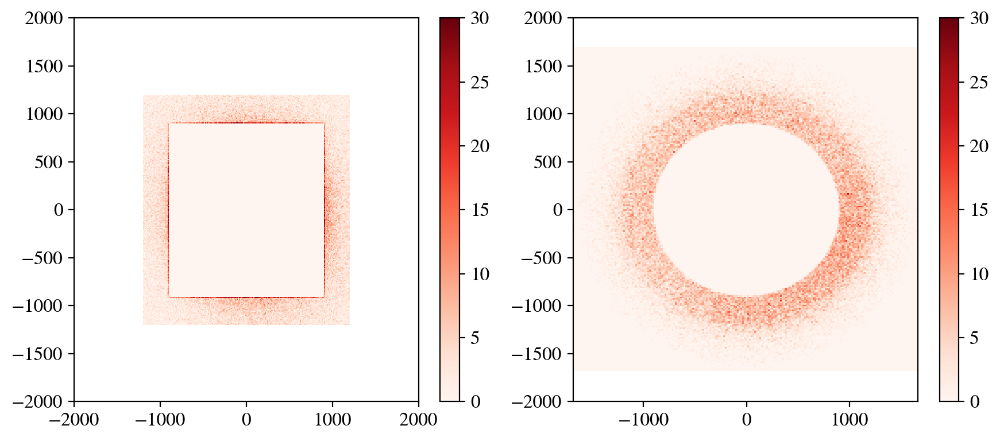

In [499]:
yoff = -3
zoff = 206
nbins = 1000 # for inverse transform sampling
l = 1800
L = 2400
norm = mcolors.Normalize(vmin=0, vmax=30)

yabs = L//2
ymin, ymax = -yabs + yoff, yabs + yoff
zmin, zmax = -yabs + zoff, yabs + zoff

## get hits inside square frame in centered cartesian frame
y_all, z_all = getCenterHits(ymin, ymax, zmin, zmax)
y_all, z_all = y_all - yoff, z_all - zoff

## 1D radial generation
nsamples = len(y_all)
rho = np.sqrt(y_all**2 + z_all**2)
phi = np.arctan2(z_all, y_all)
phi_new = generateFromDist(phi, nbins, nsamples)
rho_new = generateFromDist(rho, nbins, nsamples)

## y,z from radial generation
y_new = rho_new*np.cos(phi_new)
z_new = rho_new*np.sin(phi_new)

fig, axs = plt.subplots(1, 2, tight_layout=True, figsize=(9,4))
hist = axs[0].hist2d(y_all, z_all, 200, cmap='Reds', shading='auto', alpha=1, norm=norm)
hist2 = axs[1].hist2d(y_new, z_new, 200, cmap='Reds', shading='auto', alpha=1, norm=norm)
axs[0].set_xlim(-2000, 2000)
axs[0].set_ylim(-2000, 2000)
axs[1].set_ylim(-2000, 2000)
axs[1].set_ylim(-2000, 2000)
plt.colorbar(hist[3], ax=axs[0])
plt.colorbar(hist2[3], ax=axs[1])


print("n_square_frame = {}".format(nsamples))
y_ring, z_ring, y_frame, z_frame = generateFromDist_2D_masked(y_new, z_new, nbins, nsamples, l, L)
print("n_ring_frame = {}".format(len(y_ring)))
print("n_square_frame = {}".format(len(y_frame)))

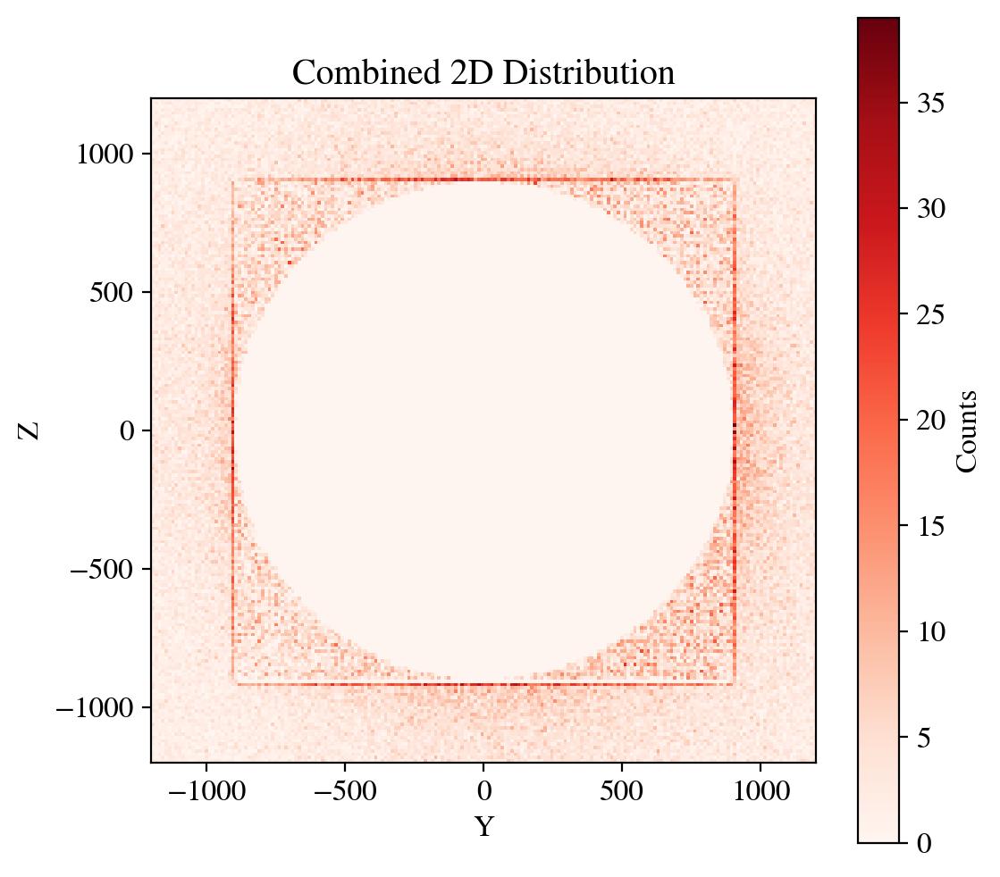

In [504]:
# Combine data
y_combined = np.concatenate([y_all, y_ring])
z_combined = np.concatenate([z_all, z_ring])

# Plot combined distribution
plt.figure(figsize=(6, 6))
plt.hist2d(y_combined, z_combined, bins=200, cmap="Reds")
# plt.hist2d(y_frame, z_frame, bins=100, cmap="Reds")
plt.gca().set_aspect("equal")
plt.xlabel("Y")
plt.ylabel("Z")
plt.title("Combined 2D Distribution")
plt.colorbar(label="Counts")
plt.show()


In [ ]:
# vmin, vmax = 0, 70
# norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

fig, axs = plt.subplots(1, 2, tight_layout=True, figsize=(9,4))

hist = axs[0].hist2d(y_all, z_all, 100, cmap='Reds', shading='auto', alpha=1)
hist2 = axs[1].hist2d(y_ring, z_ring, 100, cmap='Reds', shading='auto', alpha=1)

# plt.pcolormesh(X, Y, pdf.T, cmap='Blues', shading='auto', alpha=0.5)  # note: transpose

plt.colorbar(hist[3], ax=axs[0])
plt.colorbar(hist2[3], ax=axs[1])

axs[0].set_xlim(-2000, 2000)
axs[0].set_ylim(-2000, 2000)
axs[1].set_xlim(-2000, 2000)
axs[1].set_ylim(-2000, 2000)

In [ ]:
# vmin, vmax = 0, 70
# norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

fig, axs = plt.subplots(1, 2, tight_layout=True, figsize=(9,4))

hist = axs[0].hist2d(y_all, z_all, 100, cmap='Reds', shading='auto', alpha=1)
hist2 = axs[1].hist2d(y_ring, z_ring, 100, cmap='Reds', shading='auto', alpha=1)

# plt.pcolormesh(X, Y, pdf.T, cmap='Blues', shading='auto', alpha=0.5)  # note: transpose

plt.colorbar(hist[3], ax=axs[0])
plt.colorbar(hist2[3], ax=axs[1])

axs[0].set_xlim(-2000, 2000)
axs[0].set_ylim(-2000, 2000)
axs[1].set_xlim(-2000, 2000)
axs[1].set_ylim(-2000, 2000)

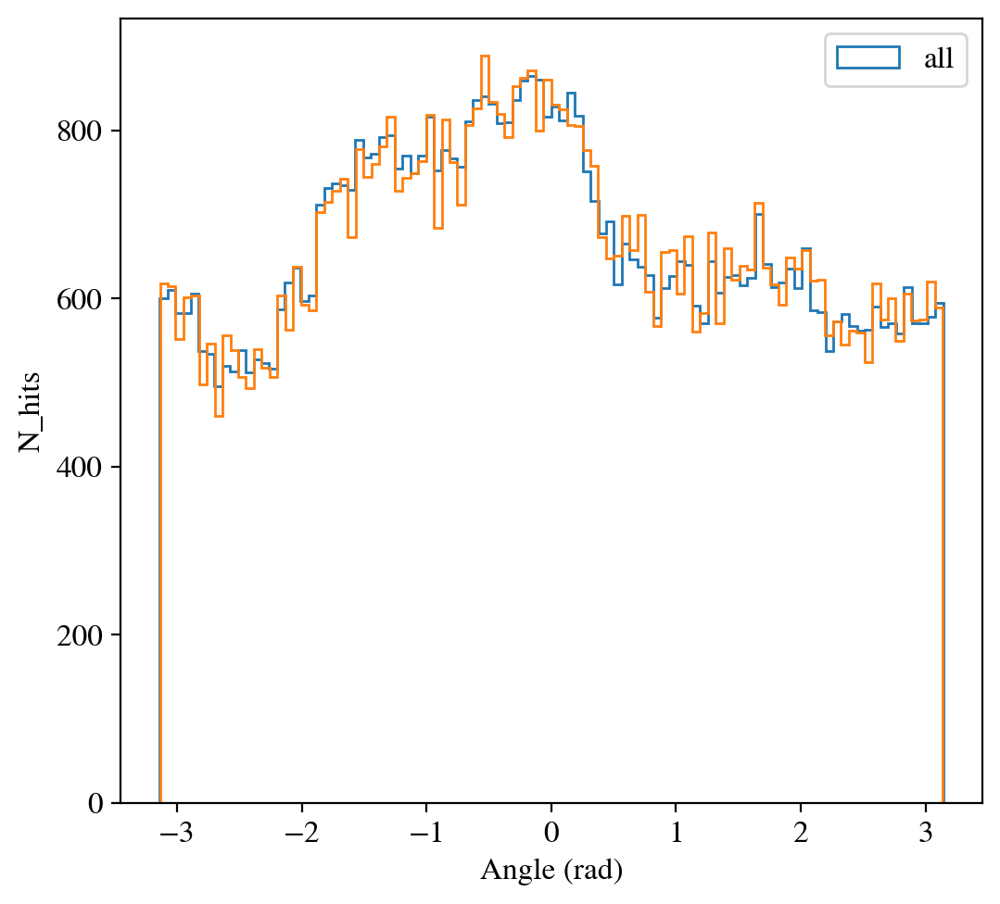

In [303]:
plt.hist(phi, 100, histtype='step', label='all')
# plt.hist(phi_neu, 100, histtype='step', label='neutrons')
# plt.hist(phi_pho, 100, histtype='step', label='photons')
plt.hist(phi_new, 100, histtype='step')
plt.xlabel('Angle (rad)')
plt.ylabel('N_hits')
plt.legend()
print("")

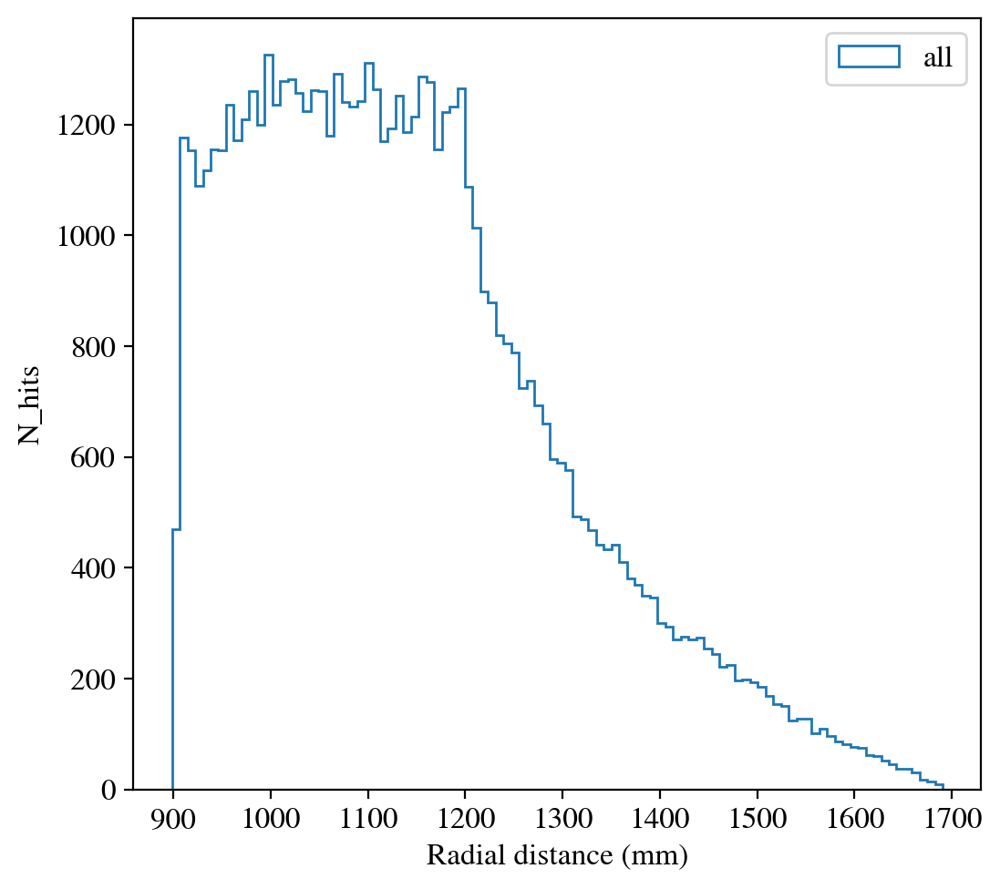

In [304]:
plt.hist(rho, 100, histtype='step', label='all')
# plt.hist(rho_neu, 100, histtype='step', label='neutrons')
# plt.hist(rho_pho, 100, histtype='step', label='photons')
# plt.hist(rho_new, 100, histtype='step')
plt.xlabel('Radial distance (mm)')
plt.ylabel('N_hits')
plt.legend()
print("")

In [305]:
900*np.sqrt(2)

1272.7922061357856

(-2000.0, 2000.0)

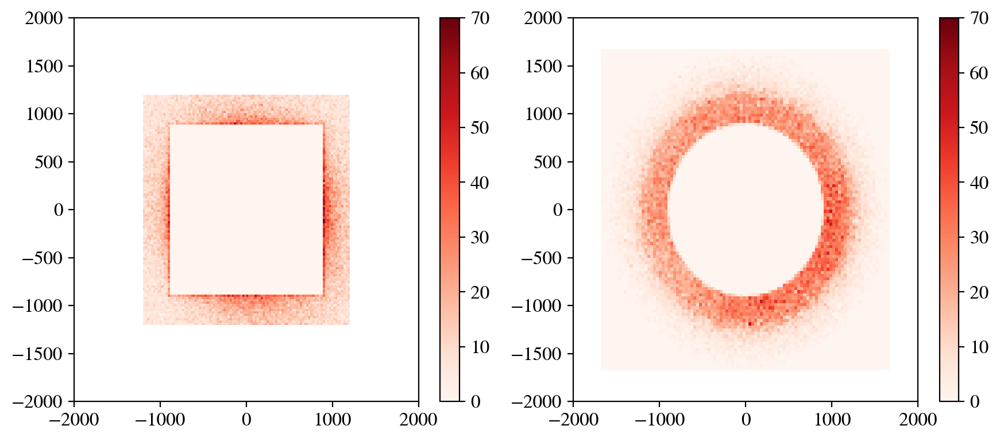

In [313]:
yabs = 1300
winHalfWidth = 1800//2 ## suppose centered hits
vmin, vmax = 0, 70

norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

# y_new = rho_new*np.cos(phi_new) + y0_beam
# z_new = rho_new*np.sin(phi_new) + z0_beam
y_new = rho_new*np.cos(phi_new)
z_new = rho_new*np.sin(phi_new)

y_new_win = []
z_new_win = []
for i in range(len(y_new)):
    yi = y_new[i]
    zi = z_new[i]
    if abs(yi)<=winHalfWidth and abs(zi)<=winHalfWidth:
        continue
    elif abs(yi)<=yabs and abs(zi)<=yabs:
        y_new_win.append(yi)
        z_new_win.append(zi)
    else:
        continue
y_new_win = np.array(y_new_win)
z_new_win = np.array(z_new_win)

# window = ((abs(y_new)+abs(z_new))>900*np.sqrt(2))

# y_new2 = y_new[window==True]*np.cos(np.pi/4) + z_new[window==True]*np.sin(np.pi/4)
# z_new2 = -y_new[window==True]*np.sin(np.pi/4) + z_new[window==True]*np.cos(np.pi/4)

fig, axs = plt.subplots(1, 2, tight_layout=True, figsize=(9,4))
# hist = axs[0].hist2d(y_all, z_all, 100, cmap='Reds', shading='auto', alpha=1)
# hist2 = axs[1].hist2d(y_new_win, z_new_win, 100, cmap='Reds', shading='auto', alpha=1)
# hist2 = axs[1].hist2d(y_new, z_new, 100, cmap='Reds', shading='auto')
hist = axs[0].hist2d(y_all, z_all, 100, cmap='Reds', shading='auto', alpha=1, norm=norm)
# hist2 = axs[1].hist2d(y_new_win, z_new_win, 100, cmap='Reds', shading='auto', alpha=1, norm=norm)
hist2 = axs[1].hist2d(y_new, z_new, 100, cmap='Reds', shading='auto', alpha=1, norm=norm)

# plt.pcolormesh(X, Y, pdf.T, cmap='Blues', shading='auto', alpha=0.5)  # note: transpose

plt.colorbar(hist[3], ax=axs[0])
plt.colorbar(hist2[3], ax=axs[1])

axs[0].set_xlim(-2000, 2000)
axs[0].set_ylim(-2000, 2000)
axs[1].set_xlim(-2000, 2000)
axs[1].set_ylim(-2000, 2000)

In [279]:
def octoSide(squareSide):
    return squareSide / (1 + np.sqrt(2))

def octoHeight(squareSide):
    l = octoSide(squareSide)
    d = l/np.sqrt(2)
    return np.sqrt( d**2 - (l/2)**2 )

In [280]:
octoSide(1800), octoHeight(1800)

(745.5844122715712, 372.7922061357856)

In [260]:
nbins = len(phi)
nbins

41489

In [ ]:
H_true, y_edges, z_edges = np.histogram2d(y_all, z_all, bins=nbins)
H_gen, _, _ = np.histogram2d(y_new, z_new, bins=nbins)

# plt.pcolormesh(X, Y, pdf.T, cmap='Blues', shading='auto', alpha=0.5)  # note: transpose


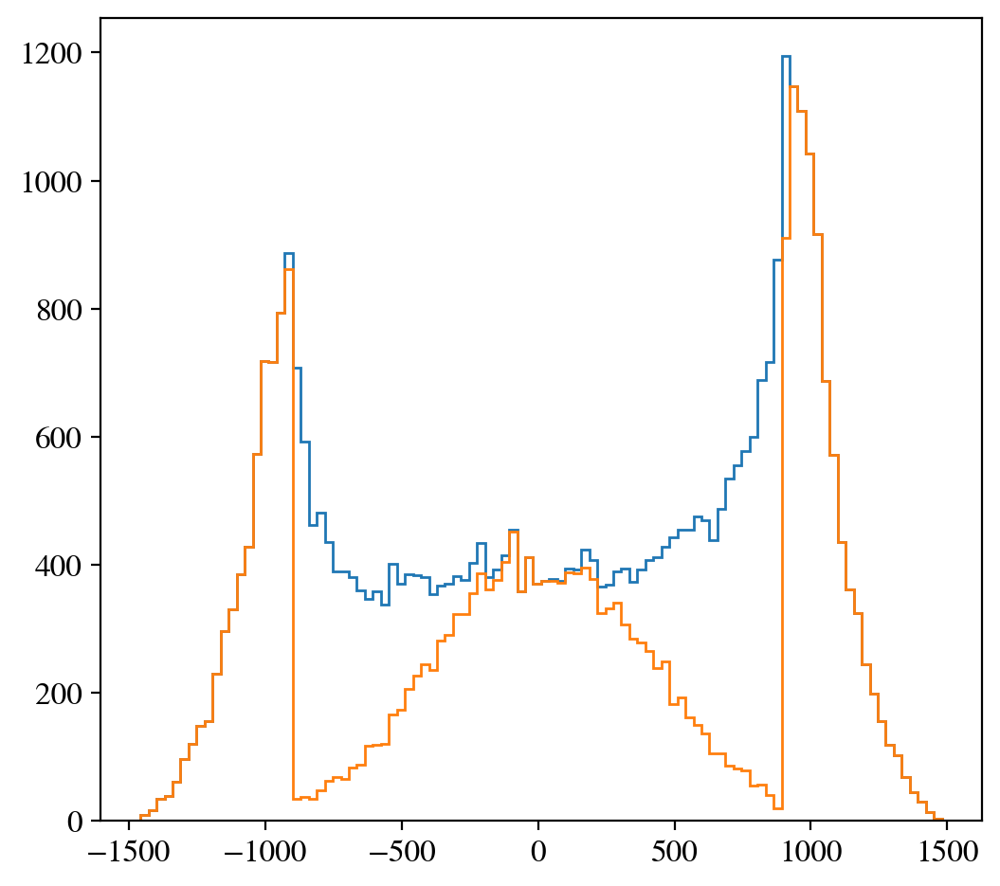

In [255]:
plt.hist(y_new, histtype='step', bins=100)
plt.hist(y_new_win, histtype='step', bins=100)
print("")

(-1457.5239235376569, 1480.3684768991025)
(-1483.8898434665434, 1474.1021924336167)


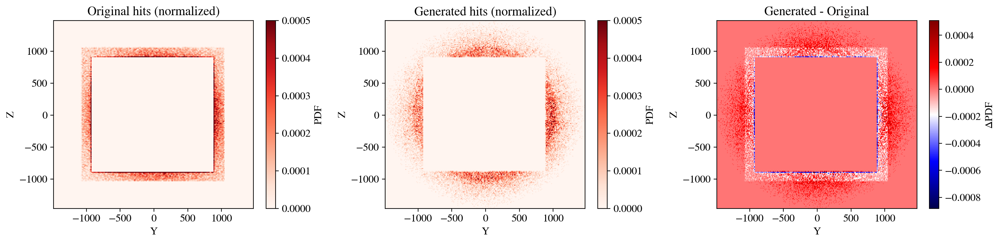

In [256]:
y_new = y_new_win
z_new = z_new_win

# Choose shared binning for comparison
nbins = 200
y_range = (min(y_all.min(), y_new.min()), max(y_all.max(), y_new.max()))
z_range = (min(z_all.min(), z_new.min()), max(z_all.max(), z_new.max()))
ranges = [y_range, z_range]
print(y_range)
print(z_range)

# Compute 2D histograms (PDFs)
H_true, y_edges, z_edges = np.histogram2d(y_all, z_all, bins=nbins, range=ranges)
H_gen, _, _ = np.histogram2d(y_new, z_new, bins=[y_edges, z_edges])

# Get bin centers
y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])
z_centers = 0.5 * (z_edges[:-1] + z_edges[1:])
Y, Z = np.meshgrid(y_centers, z_centers)

H_true /= np.sum(H_true)
H_gen  /= np.sum(H_gen)

# Plot original distribution
plt.figure(figsize=(16, 4))

plt.subplot(1, 3, 1)
plt.pcolormesh(Z, Y, H_true, shading='auto', cmap='Reds', vmin=0, vmax=0.0005)
# plt.pcolormesh(Z, Y, H_true, shading='auto', cmap='Reds')
plt.colorbar(label='PDF')
plt.title('Original hits (normalized)')
plt.xlabel('Y')
plt.ylabel('Z')

# Plot generated distribution
plt.subplot(1, 3, 2)
plt.pcolormesh(Z, Y, H_gen, shading='auto', cmap='Reds', vmin=0, vmax=0.0005)
# plt.pcolormesh(Z, Y, H_gen, shading='auto', cmap='Reds')
plt.colorbar(label='PDF')
plt.title('Generated hits (normalized)')
plt.xlabel('Y')
plt.ylabel('Z')

# Plot difference
plt.subplot(1, 3, 3)
diff = H_gen - H_true
# plt.pcolormesh(Z, Y, diff, shading='auto', cmap='seismic', vmin=-0.0005, vmax=0.0005)
plt.pcolormesh(Z, Y, diff, shading='auto', cmap='seismic')
plt.colorbar(label='ΔPDF')
plt.title('Generated - Original')
plt.xlabel('Y')
plt.ylabel('Z')

plt.tight_layout()
plt.show()


In [532]:
dd = lambda h, l, L : (h**2 + ((L-l)/2)**2)**0.5

In [535]:
np.sqrt(2)*1100

1555.6349186104046

In [533]:
dd(1000, 500, 1000)

1030.7764064044152

In [30]:
len(xmod), len(x_dist)

(163051, 1000000)

In [31]:
max(abs(x_dist))

1961.321846316499

In [44]:
# # nbinst = 1000
# # nbinst = int(1e5)
# nbinsxy = 1000
# nsamples = 10000
# # nsamples = int(nHitsPerBunch*nBunches)

# tmod = frontcrv0.HitT[frontcrv0.HitT<=2e6]
# xmod = frontcrv0.HitY[frontcrv0.HitT<=2e6]
# ymod = frontcrv0.HitZ[frontcrv0.HitT<=2e6]

# print(tmod.shape, xmod.shape, ymod.shape)
# hist3d, tbins, xbins, ybins = getPDFfromDist_3D(tmod, xmod, ymod, nbinst, nbinsxy)
# t_dist, x_dist, y_dist = generateFromDist_3D(tmod, xmod, ymod, nbinst, nbinsxy, nsamples)

# # Plot the results
# fig, ax = plt.subplots(figsize=(8, 6))
# # Plot original histogram as a heatmap
# mesh = ax.hist2d(xmod, ymod, bins=nbinsxy, cmap='Blues', density=True, alpha=0.5)
# # Overlay sampled points
# ax.scatter(x_dist, y_dist, s=1, color='red', alpha=0.1, label='Sampled')

# # Customize the plot
# ax.set_title('Original 2D Distribution vs Sampled Points')
# ax.set_xlabel('x')
# ax.set_ylabel('y')
# ax.legend()
# plt.colorbar(mesh[3], ax=ax, label='Density')
# # plt.grid(True)
# plt.tight_layout()
# plt.show()

In [32]:
frontcrv1b = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [33]:
# moduleL = 3000
# modulel = 1240
moduleL = 2740
modulel = 4240-moduleL
moduleL, modulel

(2740, 1500)

In [34]:
nstrips = 48*2 ## n_strips/module
side_length = moduleL+modulel
side_length//2, nstrips

(2120, 96)

In [35]:
## scaled nHits for redistribution 
nHits_b = int(1e6)
nPOT_b = nHits_b / nHitsPerPOT

nHits/1e6, len(x_dist)/1e6, nPOT/1e6, nPOT_b/1e6

(0.163669, 1.0, 99.995, 610.95870323641)

pdf norm = 1.15e+05



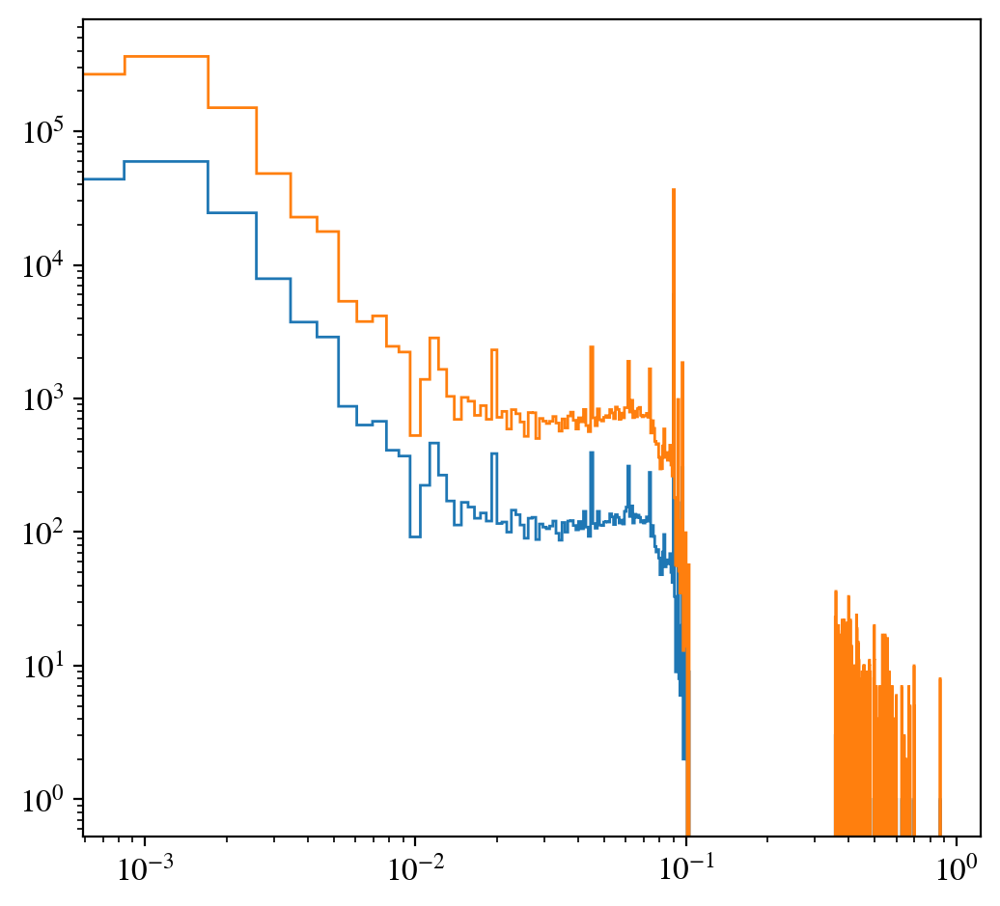

In [36]:
weights_dist = generateFromDist(frontcrv1b.RPCweights, int(1e5), int(1e6))

plt.hist(frontcrv1b.RPCweights, bins=1000, histtype='step')
plt.hist(weights_dist, bins=1000, histtype='step')
plt.xscale('log')
plt.yscale('log')
print("")

In [37]:
### use generated YZ hits and generated weights instead, and scale number of POTs.
frontcrv1b.HitY = x_dist
frontcrv1b.HitZ = y_dist
frontcrv1b.RPCweights = weights_dist
frontcrv1b.nPOT = nPOT_b
frontcrv1b.nhits = nHits_b

In [38]:
frontcrv1b.getGeometry(nstrips=96, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, L=moduleL, l=modulel, geo_type='rectangular strips 1')
frontcrv1b.getHitsPerChannel()

Rectangular module dimensions: L = 2740, l = 1500, D = 4240


In [39]:
frontcrv1b.hitRateFactor

4091.9295964798243

In [40]:
HitRateArr = []
for i in range(frontcrv1b.geometry.nstrips):
    HitRateArr.append(frontcrv1b.module1Hits[i])
    HitRateArr.append(frontcrv1b.module2Hits[i])
    HitRateArr.append(frontcrv1b.module3Hits[i])
    HitRateArr.append(frontcrv1b.module4Hits[i])
AvgHitRatePerStrip1b = np.mean(HitRateArr)
AvgHitRatePerStrip1b/1000

92.92944832243705

AvgHitRatePerStrip = 92.93 kHz
max_hit_rate = 198.43 kHz/strip


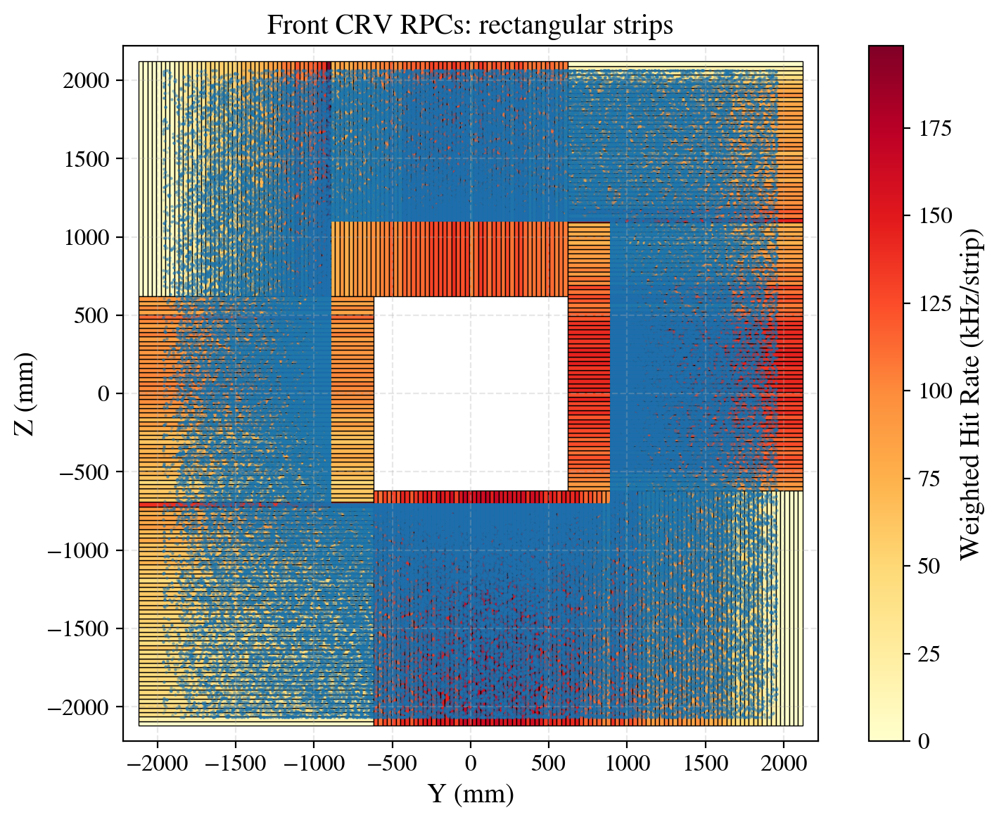

In [41]:
print("AvgHitRatePerStrip = {:.2f} kHz".format(AvgHitRatePerStrip1b/1000))
plot_strip_hitmap(frontcrv1b, plotHits=True)

In [42]:
frontcrv1 = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [43]:
frontcrv1.getGeometry(nstrips=96, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, L=moduleL, l=modulel, geo_type='rectangular strips 1')
frontcrv1.getHitsPerChannel()

Rectangular module dimensions: L = 2740, l = 1500, D = 4240


In [44]:
HitRateArr = []
for i in range(frontcrv1.geometry.nstrips):
    HitRateArr.append(frontcrv1.module1Hits[i])
    HitRateArr.append(frontcrv1.module2Hits[i])
    HitRateArr.append(frontcrv1.module3Hits[i])
    HitRateArr.append(frontcrv1.module4Hits[i])
AvgHitRatePerStrip1 = np.mean(HitRateArr)
AvgHitRatePerStrip1/1000

93.14396670898999

In [45]:
frontcrv1.geometry.L, frontcrv1.hitRateFactor

(2740, 25001.250062503124)

AvgHitRatePerStrip = 93.14 kHz
max_hit_rate = 205.71 kHz/strip


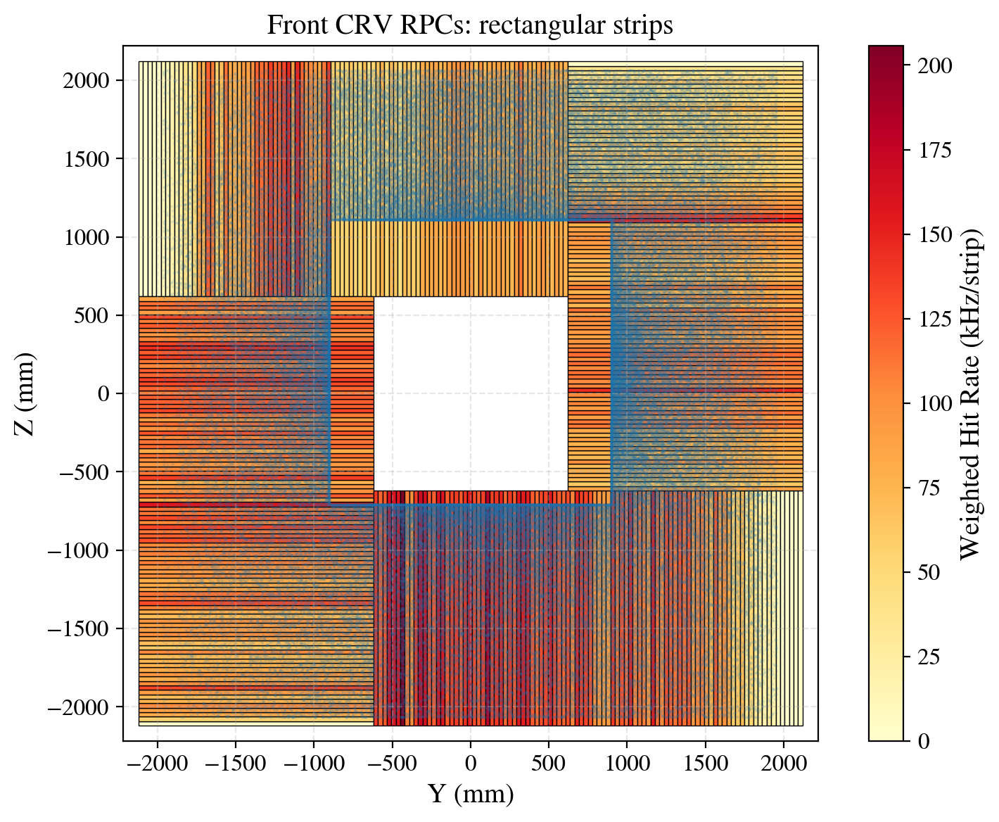

In [46]:
print("AvgHitRatePerStrip = {:.2f} kHz".format(AvgHitRatePerStrip1/1000))
plot_strip_hitmap(frontcrv1, plotHits=True)

In [47]:
frontcrv2 = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [48]:
frontcrv2.getGeometry(nstrips=96, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, L=moduleL, l=modulel, geo_type='rectangular strips 2')
frontcrv2.getHitsPerChannel()

Rectangular module dimensions: L = 2740, l = 1500, D = 4240


In [49]:
HitRateArr = []
for i in range(frontcrv2.geometry.nstrips):
    HitRateArr.append(frontcrv2.module1Hits[i])
    HitRateArr.append(frontcrv2.module2Hits[i])
    HitRateArr.append(frontcrv2.module3Hits[i])
    HitRateArr.append(frontcrv2.module4Hits[i])
AvgHitRatePerStrip2 = np.mean(HitRateArr)
AvgHitRatePerStrip2/1000

93.14396670899

AvgHitRatePerStrip = 93.14 kHz
max_hit_rate = 425.99 kHz/strip


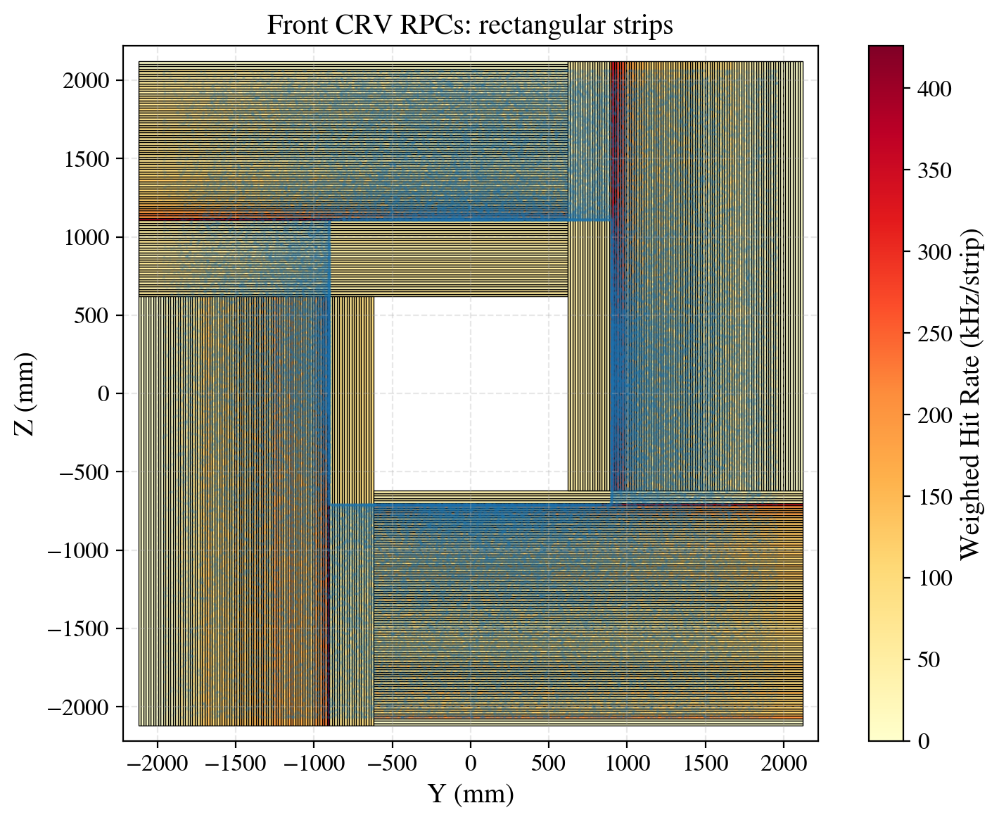

In [50]:
print("AvgHitRatePerStrip = {:.2f} kHz".format(AvgHitRatePerStrip2/1000))
plot_strip_hitmap(frontcrv2, plotHits=True)

In [53]:
hole_side = side_length - 2*modulel ## side length of hole
moduleH = (side_length - hole_side)//2 ## trapezoid height in trapezoidal geo

hole_side, moduleH

(1240, 1500)

In [54]:
moduleL+modulel, moduleL-modulel

(4240, 1240)

In [366]:
class ModuleGeoRect2b:

        def __init__(self, nstrips=10, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, Ls=[3000, 3000, 3000, 2800], ls=[1040, 1240, 1240, 1240]):
            self.nstrips = nstrips
            self.Xmax = xmax
            self.Xmin = xmin
            self.Ymax = ymax
            self.Ymin = ymin
            self.D = self.Xmax-self.Xmin
            self.Ls = np.array(Ls)
            self.ls = np.array(ls)
            # print("Rectangular module dimensions: L = {}, l = {}, D = {}".format(self.L, self.l, self.D))
            # self.pitch = self.l/self.nstrips   ## l for rect2, L for rect1
            self.makeStrips()

        def makeStrips(self):
            nstrips = self.nstrips
            dls = self.ls/nstrips
            halfLs = self.Ls/2
            yoff = (self.Ymax-self.Ymin) - self.Ls[1] - self.ls[0]
            self.yoff = yoff
            print("y_off = {}".format(yoff))
            ### module 1
            xStripsBounds1 = {} ## key: strip index, entry: strip bounds (xmin, xmax)
            yStripsBounds1 = {} ## key: strip index, entry: strip bounds (ymin, ymax)
            for i in range(nstrips):
                xStripsBounds1[i] = np.array([self.Xmin, self.Xmin + halfLs[0]])
                yStripsBounds1[i] = np.array([self.Ymax - self.ls[0] + i*dls[0], self.Ymax - self.ls[0] + (i+1)*dls[0]])
                xStripsBounds1[i+nstrips] = np.array([self.Xmin + halfLs[0], self.Xmin + 2*halfLs[0]])
                yStripsBounds1[i+nstrips] = yStripsBounds1[i]
            self.xStripsBounds1, self.yStripsBounds1 = xStripsBounds1, yStripsBounds1
            ### module 2
            xStripsBounds2 = {} ## key: strip index, entry: strip bounds (xmin, xmax)
            yStripsBounds2 = {} ## key: strip index, entry: strip bounds (ymin, ymax)
            for i in range(nstrips):
                xStripsBounds2[i] = np.array([self.Xmin + i*dls[1], self.Xmin + (i+1)*dls[1]])
                yStripsBounds2[i] = np.array([self.Ymin + yoff, self.Ymin + yoff + halfLs[1]])
                xStripsBounds2[i+nstrips] = xStripsBounds2[i]
                yStripsBounds2[i+nstrips] = np.array([self.Ymin + yoff + halfLs[1], self.Ymin + yoff + 2*halfLs[1]])
            self.xStripsBounds2, self.yStripsBounds2 = xStripsBounds2, yStripsBounds2
            ### module 3
            xStripsBounds3 = {} ## key: strip index, entry: strip bounds (xmin, xmax)
            yStripsBounds3 = {} ## key: strip index, entry: strip bounds (ymin, ymax)
            for i in range(nstrips):
                xStripsBounds3[i] = np.array([self.Xmax - 2*halfLs[2], self.Xmax - halfLs[2]])
                yStripsBounds3[i] = np.array([self.Ymin + yoff + i*dls[2], self.Ymin + yoff + (i+1)*dls[2]])
                xStripsBounds3[i+nstrips] = np.array([self.Xmax - halfLs[2], self.Xmax])
                yStripsBounds3[i+nstrips] = yStripsBounds3[i]
            self.xStripsBounds3, self.yStripsBounds3 = xStripsBounds3, yStripsBounds3
            ### module 4
            xStripsBounds4 = {} ## key: strip index, entry: strip bounds (xmin, xmax)
            yStripsBounds4 = {} ## key: strip index, entry: strip bounds (ymin, ymax)
            for i in range(nstrips):
                xStripsBounds4[i] = np.array([self.Xmax - self.ls[3] + i*dls[3], self.Xmax - self.ls[3] + (i+1)*dls[3]])
                yStripsBounds4[i] = np.array([self.Ymax - 2*halfLs[3] , self.Ymax - halfLs[3]])
                xStripsBounds4[i+nstrips] = xStripsBounds4[i]
                yStripsBounds4[i+nstrips] = np.array([self.Ymax - halfLs[3], self.Ymax])
            self.xStripsBounds4, self.yStripsBounds4 = xStripsBounds4, yStripsBounds4

            self.xAllStrips = self.xStripsBounds1 | self.xStripsBounds2 | self.xStripsBounds3 | self.xStripsBounds4
            self.yAllStrips = self.yStripsBounds1 | self.yStripsBounds2 | self.yStripsBounds3 | self.yStripsBounds4


class CRVHitMap:

    def __init__(self, inFilePath, nPOT=99995000, mode='front'):
        self.nPOT = nPOT
        self.outFileName = "{}.txt".format(Path(inFilePath).stem)
        self.file = uproot.open(inFilePath)
        self.fileKeys = self.file.keys()
        self.treeFront = self.file['treeFrontCRV']
        self.treeBack = self.file['treeBackCRV']
        self.treeFront_arr = self.treeFront.arrays()
        self.treeBack_arr = self.treeBack.arrays()
        self.getHitPos(mode)
        # self.getGeometry()
        
    def getHitPos(self, mode='front'):
        if mode=='front':
            treeFront_arr = self.treeFront_arr
            self.IsFirstHit = treeFront_arr.IsFirstHit
            self.RPCweights = treeFront_arr.RpcSensitivity[self.IsFirstHit==True]
            self.HitT = np.array(treeFront_arr.PositionT)[self.IsFirstHit==True]
            self.HitX = np.array(treeFront_arr.PositionX)[self.IsFirstHit==True]
            self.HitY = np.array(treeFront_arr.PositionY)[self.IsFirstHit==True]
            self.HitZ = np.array(treeFront_arr.PositionZ)[self.IsFirstHit==True]
            self.nhits = len(self.HitT)

    def getGeometry(self, nstrips=10, L=3000, l=1240, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, geo_type="rectangular strips 1"):
        self.geo_type = geo_type
        if geo_type=='grid':
            self.geometry = ModuleGeoGrid(ngrid=nstrips, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
        elif geo_type=='rectangular strips 1':
            self.geometry = ModuleGeoRect1(nstrips=nstrips, L=L, l=l, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
        elif geo_type=='rectangular strips 2':
            self.geometry = ModuleGeoRect2(nstrips=nstrips, L=L, l=l, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
        elif geo_type=='trapezoidal strips':
            self.geometry = ModuleGeoTrapezoidal(nstrips=nstrips, H=L, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
        elif geo_type=='rectangular strips 2b':
            self.geometry = ModuleGeoRect2b(nstrips=nstrips, Ls=L, ls=l, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)

    def getHitsPerChannel(self):
        self.POTperSec = 2.5e12 
        self.hitRateFactor = self.POTperSec / self.nPOT
        if self.geo_type=='rectangular strips 1' or self.geo_type=='rectangular strips 2':
            nstrips = self.geometry.nstrips
            self.module1Hits = {i : 0 for i in range(nstrips)}
            self.module2Hits = {i : 0 for i in range(nstrips)}
            self.module3Hits = {i : 0 for i in range(nstrips)}
            self.module4Hits = {i : 0 for i in range(nstrips)}
            for ihit in range(self.nhits):
                # iterate over hits
                xi = self.HitY[ihit]
                yi = self.HitZ[ihit]
                weight = self.RPCweights[ihit]
                # check if hit is in module
                if self.geometry.xBounds1[0]<=xi<self.geometry.xBounds1[1] and self.geometry.yBounds1[0]<=yi<self.geometry.yBounds1[1]:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds1[i][0]<=xi<self.geometry.xStripsBounds1[i][1] and self.geometry.yStripsBounds1[i][0]<=yi<self.geometry.yStripsBounds1[i][1]:
                            self.module1Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module
                elif self.geometry.xBounds2[0]<=xi<self.geometry.xBounds2[1] and self.geometry.yBounds2[0]<=yi<self.geometry.yBounds2[1]:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds2[i][0]<=xi<self.geometry.xStripsBounds2[i][1] and self.geometry.yStripsBounds2[i][0]<=yi<self.geometry.yStripsBounds2[i][1]:
                            self.module2Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module
                elif self.geometry.xBounds3[0]<=xi<self.geometry.xBounds3[1] and self.geometry.yBounds3[0]<=yi<self.geometry.yBounds3[1]:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds3[i][0]<=xi<self.geometry.xStripsBounds3[i][1] and self.geometry.yStripsBounds3[i][0]<=yi<self.geometry.yStripsBounds3[i][1]:
                            self.module3Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module
                elif self.geometry.xBounds4[0]<=xi<self.geometry.xBounds4[1] and self.geometry.yBounds4[0]<=yi<self.geometry.yBounds4[1]:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds4[i][0]<=xi<self.geometry.xStripsBounds4[i][1] and self.geometry.yStripsBounds4[i][0]<=yi<self.geometry.yStripsBounds4[i][1]:
                            self.module4Hits[i] += 1*weight*self.hitRateFactor
                            break

        elif self.geo_type=='trapezoidal strips':
            self.stripHits = {i: 0 for i in self.geometry.allStrips}
            for ihit in range(self.nhits):
                xi = self.HitY[ihit]  # Assuming same convention
                yi = self.HitZ[ihit]
                point = Point(xi, yi)
                weight = self.RPCweights[ihit]
                for i, polygon in self.geometry.allStrips.items():
                    if polygon.contains(point):
                        self.stripHits[i] += 1 * weight * self.hitRateFactor
                        break

        elif self.geo_type=='grid':
            ngrid2 = self.geometry.ngrid**2
            gridHits = {i : 0 for i in range(ngrid2)}
            xBounds = self.geometry.xBounds
            yBounds = self.geometry.yBounds
            for ihit in range(self.nhits):
                # iterate over hits
                xi = self.HitY[ihit]
                yi = self.HitZ[ihit]
                weight = self.RPCweights[ihit]
                # check if hit is in grid
                for i in range(ngrid2):
                    if xBounds[i][0]<=xi<xBounds[i][1] and yBounds[i][0]<=yi<yBounds[i][1]:
                        gridHits[i] += 1*weight*self.hitRateFactor
                        break
            self.gridHits = gridHits
        
        elif self.geo_type=='rectangular strips 2b':
            geo = self.geometry
            yoff = geo.yoff
            nstrips = 2*geo.nstrips ## n strips per module includes 2 PCBs
            self.module1Hits = {i : 0 for i in range(nstrips)}
            self.module2Hits = {i : 0 for i in range(nstrips)}
            self.module3Hits = {i : 0 for i in range(nstrips)}
            self.module4Hits = {i : 0 for i in range(nstrips)}
            for ihit in range(self.nhits):
                # iterate over hits
                xi = self.HitY[ihit]
                yi = self.HitZ[ihit]
                weight = self.RPCweights[ihit]
                # check if hit is in module 1
                if geo.Xmin<=xi<(geo.Xmin+geo.Ls[0]) and (geo.Ymax-geo.ls[0])<=yi<geo.Ymax:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds1[i][0]<=xi<self.geometry.xStripsBounds1[i][1] and self.geometry.yStripsBounds1[i][0]<=yi<self.geometry.yStripsBounds1[i][1]:
                            self.module1Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module 2
                elif geo.Xmin<=xi<(geo.Xmin+geo.ls[1]) and (geo.Ymin+yoff)<=yi<(geo.Ymin+geo.Ls[1]+yoff):
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds2[i][0]<=xi<self.geometry.xStripsBounds2[i][1] and self.geometry.yStripsBounds2[i][0]<=yi<self.geometry.yStripsBounds2[i][1]:
                            self.module2Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module 3
                elif (geo.Xmax-geo.Ls[2])<=xi<geo.Xmax and (geo.Ymin+yoff)<=yi<(geo.Ymin+geo.ls[2]+yoff):
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds3[i][0]<=xi<self.geometry.xStripsBounds3[i][1] and self.geometry.yStripsBounds3[i][0]<=yi<self.geometry.yStripsBounds3[i][1]:
                            self.module3Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module 4
                elif (geo.Xmax-geo.ls[3])<=xi<geo.Xmax and (geo.Ymax-geo.Ls[3])<=yi<geo.Ymax:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds4[i][0]<=xi<self.geometry.xStripsBounds4[i][1] and self.geometry.yStripsBounds4[i][0]<=yi<self.geometry.yStripsBounds4[i][1]:
                            self.module4Hits[i] += 1*weight*self.hitRateFactor
                            break



In [367]:
frontcrv2b = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [ ]:
Ls=[3000, 3000, 3000, 2800]
ls=[1040, 1240, 1240, 1240]

frontcrv2b.getGeometry(nstrips=48, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, L=Ls, l=ls, geo_type='rectangular strips 2b')
frontcrv2b.getHitsPerChannel()

y_off = 200


In [409]:
HitRateArr = []
for i in range(frontcrv2b.geometry.nstrips):
    HitRateArr.append(frontcrv2b.module1Hits[i])
    HitRateArr.append(frontcrv2b.module2Hits[i])
    HitRateArr.append(frontcrv2b.module3Hits[i])
    HitRateArr.append(frontcrv2b.module4Hits[i])
AvgHitRatePerStrip2b = np.mean(HitRateArr)
AvgHitRatePerStrip2b/1000

92.32935981180259

AvgHitRatePerStrip = 92.33 kHz
max_hit_rate = 530.00 kHz/strip


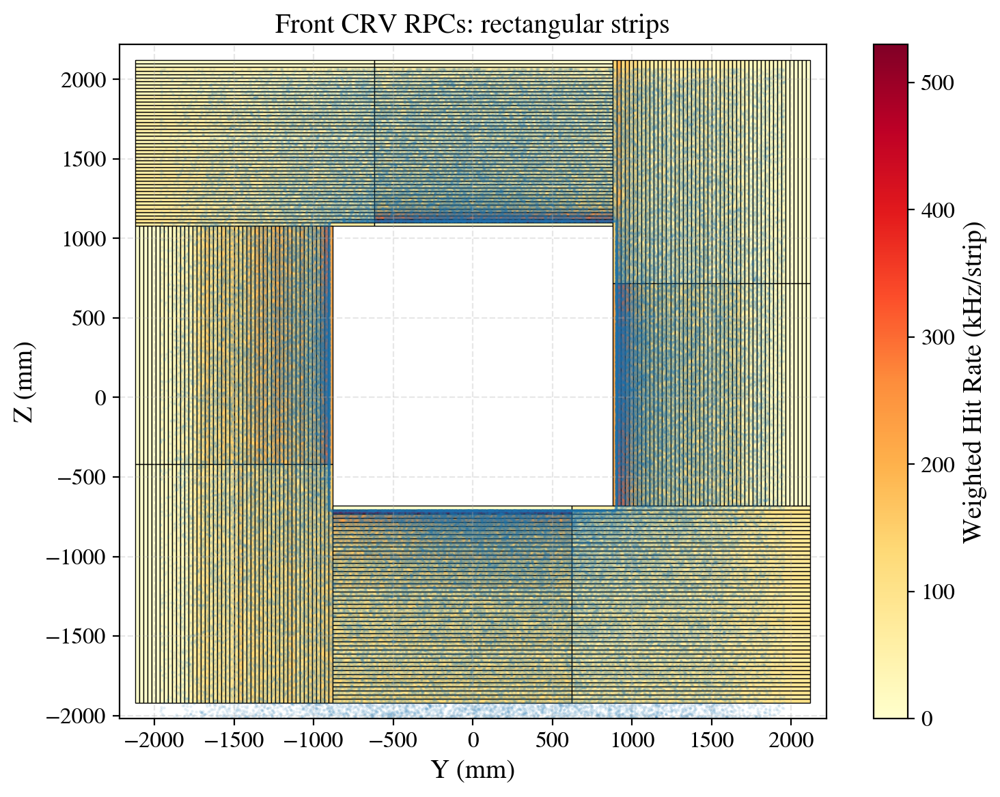

In [412]:
print("AvgHitRatePerStrip = {:.2f} kHz".format(AvgHitRatePerStrip2b/1000))
plot_strip_hitmap(frontcrv2b, plotHits=True)

In [55]:
frontcrv3 = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [56]:
frontcrv3.getGeometry(nstrips=24, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, L=1500, geo_type='trapezoidal strips')
frontcrv3.getHitsPerChannel()

Trapezoidal module dimensions: L = 4240, l = 1240, H = 1500


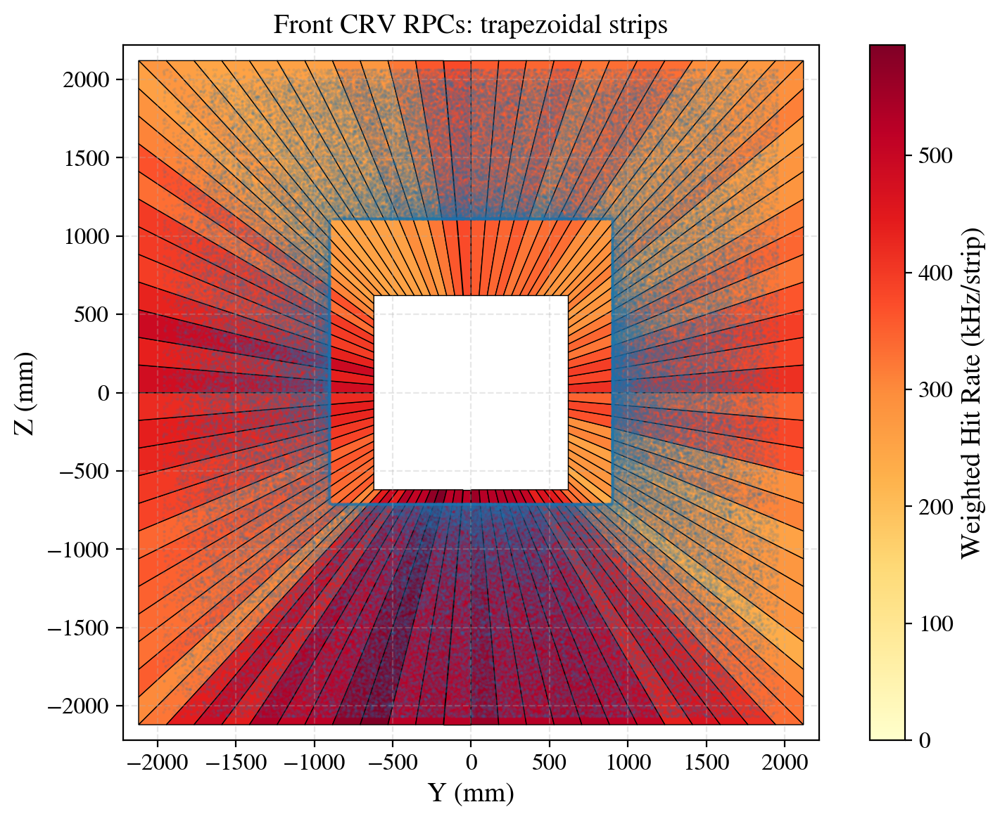

In [57]:
plot_trapezoidal_strip_hitmap(frontcrv3, plotHits=True)

In [58]:
np.stack([[1,2,3], [4,5,6]], axis=1)

array([[1, 4],
       [2, 5],
       [3, 6]])

In [59]:
stripPitch = 0.1*frontcrv1.geometry.pitch ## in cm
stripSurface = stripPitch * 0.1*frontcrv1.geometry.l ## in cm2
# stripSurface = stripPitch * 0.1*frontcrv1.geometry.L ## in cm2

stripPitch, stripSurface

(2.854166666666667, 428.12500000000006)

In [60]:
module1Hits_arr = np.array([ d for i,d in frontcrv1.module1Hits.items()])

np.mean(module1Hits_arr), np.mean(module1Hits_arr)/stripSurface

(76069.02734899335, 177.67947993925452)

In [61]:
frontcrv1.module1Hits

{0: 0,
 1: 0,
 2: 0,
 3: 0,
 4: 0,
 5: 12655.15492949971,
 6: 12020.697398193372,
 7: 18896.103374178532,
 8: 18760.04450322851,
 9: 23264.015638445024,
 10: 38565.937464324445,
 11: 24366.70192351121,
 12: 49299.482540703444,
 13: 89584.83017711612,
 14: 76291.41926539864,
 15: 121628.33115079282,
 16: 108772.7312016487,
 17: 54646.03792574808,
 18: 69347.16678676632,
 19: 113003.41960780586,
 20: 79786.52612500092,
 21: 79071.69808961905,
 22: 78015.24403475419,
 23: 94421.20383579854,
 24: 89171.76064437004,
 25: 100184.78389742834,
 26: 120660.5545579459,
 27: 115445.67229067304,
 28: 113463.48040594932,
 29: 136141.66828685201,
 30: 116747.67325619758,
 31: 121432.05699621883,
 32: 133733.05142917673,
 33: 148781.89013653158,
 34: 91576.26253780059,
 35: 149488.94570858916,
 36: 119326.33980436691,
 37: 101318.75011502882,
 38: 103647.58488214985,
 39: 92217.91233003773,
 40: 79196.19105154292,
 41: 111569.28333168112,
 42: 137720.12877048747,
 43: 57317.079294145165,
 44: 56201.7